# More Python / Numerical Python



In [1]:
import numpy as np
import pandas as pd
from astropy.io import fits
import matplotlib as mpl
import matplotlib.pyplot as plt
from scipy.ndimage import median_filter, percentile_filter, gaussian_filter, maximum_filter
import sys; sys.path.append('/home/dyson/fall25/180ASTR')
import match_stars
import a180
import match_stars as ms
from phot_calcs import find_star_center
import os
from scipy.interpolate import interp1d

# Lab 4: Color-Magnitude Diagram


## Basic Data Reduction

One of the first tasks is to reduce all the data frames, namely through the creation of a flat field frames for each filter used, then sky-subtraction and flat-field correction of all target and photometric standard star exposures.


In [2]:
reduced_dir = '/home/dyson/fall25/180ASTR/Lab4/reduced/'
images_dir = '/home/dyson/fall25/180ASTR/Lab4/images/'

# Load the two FITS images
image1 = fits.open(reduced_dir + 'iexu15030_drz.fits')
image2 = fits.open(reduced_dir + 'iexu15040_drc.fits')

Image 1 shape: (5743, 5493)
Image 2 shape: (5542, 5290)
Image 1 stats - min: -1.1489226 max: 248.12457 mean: 0.13927451
Image 2 stats - min: -1.112889 max: 139.55145 mean: 0.100564666
Image 1 header info:
  FILTER: F606W
  EXPTIME: 844.0 seconds
  PHOTFLAM: 1.18593915e-19 (erg/cm^2/s/Angstrom per count/s)
  PHOTZPT: -21.1 (Vega magnitude zero point)
  PHOTPLAM: 5888.43895 (pivot wavelength in Angstroms)

Image 2 header info:
  FILTER: F814W
  EXPTIME: 1426.0 seconds
  PHOTFLAM: 1.5200928e-19 (erg/cm^2/s/Angstrom per count/s)
  PHOTZPT: -21.1 (Vega magnitude zero point)
  PHOTPLAM: 8034.189 (pivot wavelength in Angstroms)
Displaying images...


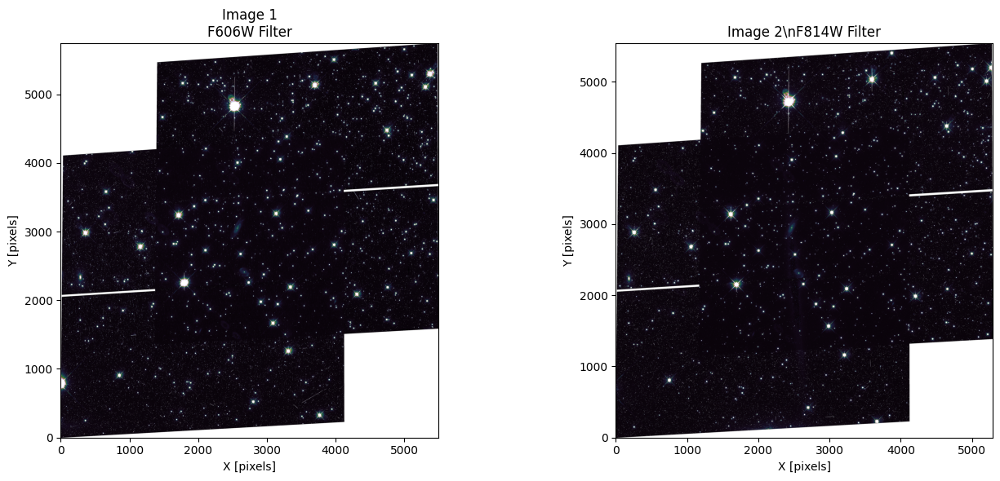

In [3]:
# Extract the data arrays from extension 1 (SCI extension)
im1 = image1[1].data
im2 = image2[1].data
header1 = image1[1].header
header2 = image2[1].header

# Check the shape and basic statistics

print("Image 1 shape:", im1.shape)
print("Image 2 shape:", im2.shape)
print("Image 1 stats - min:", np.nanmin(im1), "max:", np.nanmax(im1), "mean:", np.nanmean(im1))
print("Image 2 stats - min:", np.nanmin(im2), "max:", np.nanmax(im2), "mean:", np.nanmean(im2))

# Check headers for important information

print("Image 1 header info:")
print("  FILTER:", image1[0].header.get('FILTER'))
print("  EXPTIME:", image1[0].header.get('EXPTIME'), "seconds")
print("  PHOTFLAM:", header1.get('PHOTFLAM'), "(erg/cm^2/s/Angstrom per count/s)")
print("  PHOTZPT:", header1.get('PHOTZPT'), "(Vega magnitude zero point)")
print("  PHOTPLAM:", header1.get('PHOTPLAM'), "(pivot wavelength in Angstroms)")

print("\nImage 2 header info:")
print("  FILTER:", image2[0].header.get('FILTER'))
print("  EXPTIME:", image2[0].header.get('EXPTIME'), "seconds")
print("  PHOTFLAM:", header2.get('PHOTFLAM'), "(erg/cm^2/s/Angstrom per count/s)")
print("  PHOTZPT:", header2.get('PHOTZPT'), "(Vega magnitude zero point)")
print("  PHOTPLAM:", header2.get('PHOTPLAM'), "(pivot wavelength in Angstroms)")

# Display the images

print("Displaying images...")
fig, axes = plt.subplots(1, 2, figsize=(14, 6))

vmin = np.nanpercentile(im1, 1)
vmax = np.nanpercentile(im1, 99)

axes[0].imshow(im1, origin='lower', vmin=vmin, vmax=vmax, cmap='cubehelix')
axes[0].set_title('Image 1\nF606W Filter')
axes[0].set_xlabel('X [pixels]')
axes[0].set_ylabel('Y [pixels]')

axes[1].imshow(im2, origin='lower', vmin=vmin, vmax=vmax, cmap='cubehelix')
axes[1].set_title('Image 2\\nF814W Filter')
axes[1].set_xlabel('X [pixels]')
axes[1].set_ylabel('Y [pixels]')

plt.tight_layout()

plt.show()

Investigating NaN pixels...

V-band (F606W):
  Total pixels: 31546299
  NaN pixels: 5563688
  NaN percentage: 17.64%
  Non-NaN pixels: 25982611
  Rows with NaNs: 5743 out of 5743
  Cols with NaNs: 5493 out of 5493

I-band (F814W):
  Total pixels: 29317180
  NaN pixels: 4456162
  NaN percentage: 15.20%
  Non-NaN pixels: 24861018
  Rows with NaNs: 5542 out of 5542
  Cols with NaNs: 5290 out of 5290


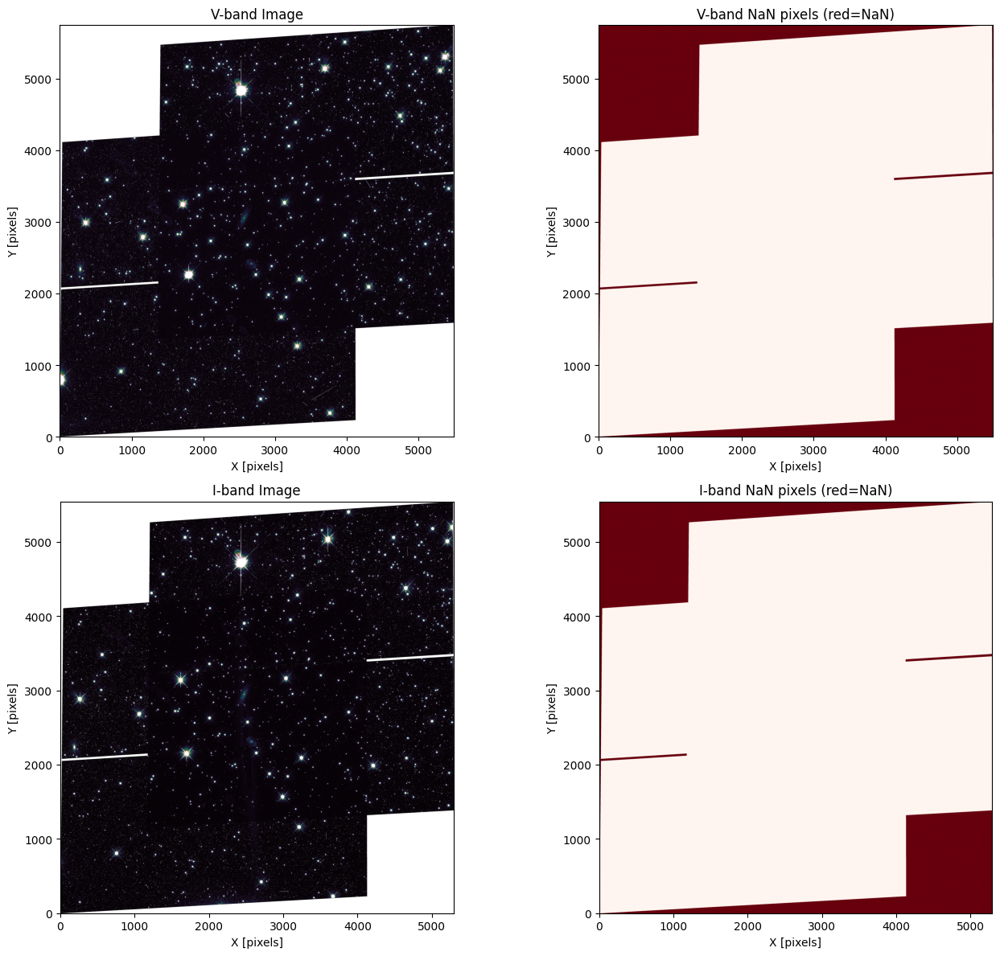

In [4]:

print("Investigating NaN pixels...")


# V-band investigation
print("\nV-band (F606W):")
print(f"  Total pixels: {im1.size}")
print(f"  NaN pixels: {np.sum(np.isnan(im1))}")
print(f"  NaN percentage: {100 * np.sum(np.isnan(im1)) / im1.size:.2f}%")
print(f"  Non-NaN pixels: {np.sum(~np.isnan(im1))}")

# Check if NaNs are at the edges (from drizzling)
nan_mask_V = np.isnan(im1)
nan_rows_V = np.where(np.any(nan_mask_V, axis=1))[0]
nan_cols_V = np.where(np.any(nan_mask_V, axis=0))[0]
print(f"  Rows with NaNs: {len(nan_rows_V)} out of {im1.shape[0]}")
print(f"  Cols with NaNs: {len(nan_cols_V)} out of {im1.shape[1]}")

# I-band investigation
print("\nI-band (F814W):")
print(f"  Total pixels: {im2.size}")
print(f"  NaN pixels: {np.sum(np.isnan(im2))}")
print(f"  NaN percentage: {100 * np.sum(np.isnan(im2)) / im2.size:.2f}%")
print(f"  Non-NaN pixels: {np.sum(~np.isnan(im2))}")

nan_mask_I = np.isnan(im2)
nan_rows_I = np.where(np.any(nan_mask_I, axis=1))[0]
nan_cols_I = np.where(np.any(nan_mask_I, axis=0))[0]
print(f"  Rows with NaNs: {len(nan_rows_I)} out of {im2.shape[0]}")
print(f"  Cols with NaNs: {len(nan_cols_I)} out of {im2.shape[1]}")

# Visualize where the NaNs are
fig, axes = plt.subplots(2, 2, figsize=(14, 12))

# V-band image
axes[0, 0].imshow(im1, origin='lower', vmin=np.nanpercentile(im1, 1), 
                   vmax=np.nanpercentile(im1, 99), cmap='cubehelix')
axes[0, 0].set_title('V-band Image')
axes[0, 0].set_xlabel('X [pixels]')
axes[0, 0].set_ylabel('Y [pixels]')

# V-band NaN mask
axes[0, 1].imshow(nan_mask_V, origin='lower', cmap='Reds')
axes[0, 1].set_title('V-band NaN pixels (red=NaN)')
axes[0, 1].set_xlabel('X [pixels]')
axes[0, 1].set_ylabel('Y [pixels]')

# I-band image
axes[1, 0].imshow(im2, origin='lower', vmin=np.nanpercentile(im2, 1), 
                   vmax=np.nanpercentile(im2, 99), cmap='cubehelix')
axes[1, 0].set_title('I-band Image')
axes[1, 0].set_xlabel('X [pixels]')
axes[1, 0].set_ylabel('Y [pixels]')

# I-band NaN mask
axes[1, 1].imshow(nan_mask_I, origin='lower', cmap='Reds')
axes[1, 1].set_title('I-band NaN pixels (red=NaN)')
axes[1, 1].set_xlabel('X [pixels]')
axes[1, 1].set_ylabel('Y [pixels]')

plt.tight_layout()
plt.show()

## Identifying the stars

We'll want a method for identifying stars so that we can assign each a unique identifier.  We only really need to identify stars for which we can get detections in all bands.

We can make the identifications in the mosaic frame.  However, when we do photometry, we should try (if possible) to do it in each target exposure, then later combine the photometry.

To identify stars, we'll first remove NaN pixels (an possibly cosmic rays) and then find peaks in the images. 

### Removing NaNs and Cosmic Rays

We'll want a robust way of automatically identifying stars.  This could be done by first smoothing the image then identifying the peaks.  However, we have the confounding factor of cosmic ray hits.  (Note that they could be posive or negative, since we subtracted sky exposures.)  So we will first want to identify all the cosmic rays.  Then we can tag them with NaN values just as we did with bad pixels in the calibration steps above.  Finally, we can, for the identification steps, replace the NaN values with a combination of good values from the pixels' neighbors. **NOTE** doing cosmic ray removal can take a really long time! It's okay to skip this step if you took more than 1 image at each mosaic position and you median combined them.

In [5]:
def median_replace(im, medfilt=5):
    """Replace NaN values with those determined from a local median filter,
    and replace any remaining negative values with 0."""
    
    mfim = median_filter(im, size=medfilt,
                         #mode='constant',
                         cval=0.)

    # get locations where value is NaN
    w = np.isnan(im)
    # replace those locations in the image with values from the median-filtered image
    pim = im.copy()
    pim[w] = mfim[w]
    
    # Replace any remaining negative values with ~0
    pim[pim < 0] = 0.00001
    
    return pim


def identify_cr(im, thresh=10.):
    """
    return an index array of pixels flagged to be possible cosmic-ray hits.  
    thresh gives a factor for how many times above (or below) the local background 
    sigma a pixel must be to be flagged.
    """

    # do a high-pass filter to take out "sky" variations
    skyfilt = 50 # [pix]
    sfim = im - median_filter(im, size=skyfilt,
                              #mode='constant',
                              cval=0.)

    
    # estimate the local image sigma.  Don't use standard deviation, since that will be biased by CRs.
    # Instead, use rank filters
    sigfilt = 10 # [pix]
    pf1 = percentile_filter(sfim, 50-34.1, size=sigfilt,
                            cval=0.)
    pf2 = percentile_filter(sfim, 50+34.1, size=sigfilt,
                            cval=0.)
    sig = (pf2-pf1)/2. # half dist. between locations of 1-sig confidence

    
    # now patch over NaNs with a median-filtered image
    medfilt = 5 # [pix]
    tsfim = median_replace(sfim, medfilt=medfilt)
    
    
    bad = (tsfim > tsfim + thresh*sig) | (tsfim < tsfim - thresh*sig)
    
    return np.nonzero(bad)

In [6]:
# Image 1: F606W (V-band)
# Image 2: F814W (I-band)

print("Processing F606W (V-band) image")


# Process V-band image (F555W)
print(f"Original V-band NaN pixels: {np.sum(np.isnan(im1))}")
mos_V = median_replace(im1)
print(f"After cleaning V-band NaN pixels: {np.sum(np.isnan(mos_V))}")
print(f"V-band shape: {mos_V.shape}")
print(f"V-band stats - min: {np.nanmin(mos_V):.3f}, max: {np.nanmax(mos_V):.3f}, mean: {np.nanmean(mos_V):.3f}")


print("Processing F814W (I-band) image")

# Process I-band image (F814W)
print(f"Original I-band NaN pixels: {np.sum(np.isnan(im2))}")
mos_I = median_replace(im2)
print(f"After cleaning I-band NaN pixels: {np.sum(np.isnan(mos_I))}")
print(f"I-band shape: {mos_I.shape}")
print(f"I-band stats - min: {np.nanmin(mos_I):.3f}, max: {np.nanmax(mos_I):.3f}, mean: {np.nanmean(mos_I):.3f}")

calib_info = {
    'V': {
        'filter': image1[0].header.get('FILTER'),
        'exptime': image1[0].header.get('EXPTIME'),
        'photflam': header1.get('PHOTFLAM'),
        'photzpt': header1.get('PHOTZPT'),
        'photplam': header1.get('PHOTPLAM'),
        'image': mos_V
    },
    'I': {
        'filter': image2[0].header.get('FILTER'),
        'exptime': image2[0].header.get('EXPTIME'),
        'photflam': header2.get('PHOTFLAM'),
        'photzpt': header2.get('PHOTZPT'),
        'photplam': header2.get('PHOTPLAM'),
        'image': mos_I
    }
}

Processing F606W (V-band) image
Original V-band NaN pixels: 5563688
After cleaning V-band NaN pixels: 5542305
V-band shape: (5743, 5493)
V-band stats - min: 0.000, max: 248.125, mean: 0.143
Processing F814W (I-band) image
Original I-band NaN pixels: 4456162
After cleaning I-band NaN pixels: 4436296
I-band shape: (5542, 5290)
I-band stats - min: 0.000, max: 139.551, mean: 0.103


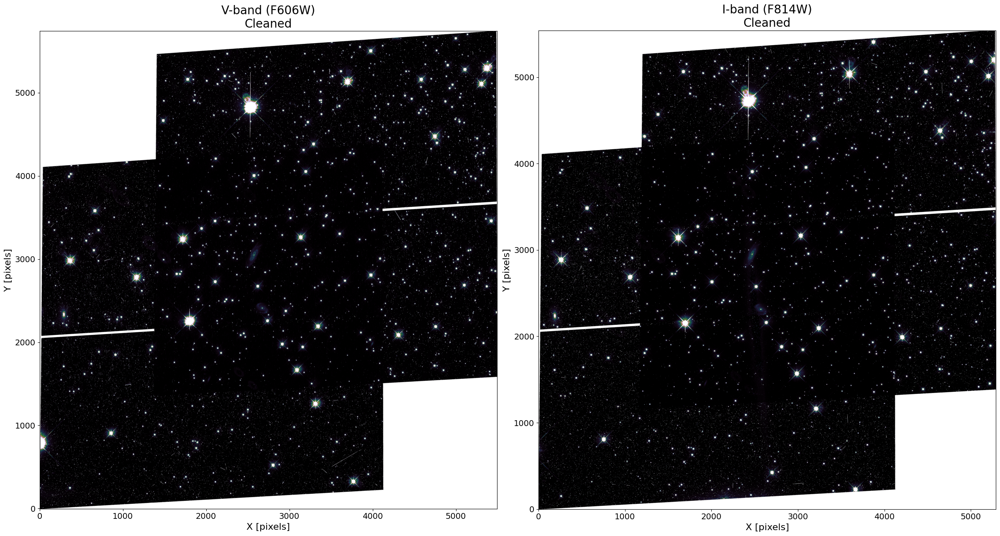

In [7]:
# Display both cleaned images
fig, axes = plt.subplots(1, 2, figsize=(24, 20))

# V-band
vmin_V = np.nanpercentile(mos_V, 1)
vmax_V = np.nanpercentile(mos_V, 99)
axes[0].imshow(mos_V, origin='lower', vmin=vmin_V, vmax=vmax_V, cmap='cubehelix')
axes[0].set_title('V-band (F606W)\nCleaned', fontsize=20)
axes[0].set_xlabel('X [pixels]', fontsize=16)
axes[0].set_ylabel('Y [pixels]', fontsize=16)
axes[0].tick_params(axis='both', labelsize=14)

# I-band
vmin_I = np.nanpercentile(mos_I, 1)
vmax_I = np.nanpercentile(mos_I, 99)
axes[1].imshow(mos_I, origin='lower', vmin=vmin_I, vmax=vmax_I, cmap='cubehelix')
axes[1].set_title('I-band (F814W)\nCleaned', fontsize=20)
axes[1].set_xlabel('X [pixels]', fontsize=16)
axes[1].set_ylabel('Y [pixels]', fontsize=16)
axes[1].tick_params(axis='both', labelsize=14)

plt.tight_layout()
plt.savefig(images_dir + 'cleaned_images.png', dpi=300)
plt.show()

### Find point sources
Now we should have clean mosaics in which we can identify stars.

To identify the stars automatically, we can first smooth by a Gaussian (to approximate the response of the imaging system to a point-like star, and reject noise that doesn't look like a star), then identify the peaks above a threshold. See the code in ``/home/a180i/lib/python/a180.py`` for more details about how this method works. 

Choose to identify in only one filter, such that those stars are detected in all filters and we don't have to do complicated cross-matching.

At the end of this identification step, we want to have in-hand a list of stellar $(x,y)$ positions in the mosaic frame.

**NOTE**: if you are having trouble with point source identification, you can try to use the ``photutils`` package. Instructions are here on how to use this package to do point source detection: https://photutils.readthedocs.io/en/stable/detection.html 

In [8]:
def detect_bright_stars_initial(image, thresh=60, psf_sigma=4.5, max_filter_size=80):
    """Initial detection of bright star candidates"""
    filtered = gaussian_filter(image, psf_sigma)
    mim = maximum_filter(filtered, size=max_filter_size)
    ispeak = (filtered == mim) & (filtered >= thresh)
    ys, xs = np.nonzero(ispeak)
    return np.column_stack([ys, xs])


def refine_bright_stars(image, initial_positions, min_separation=40, 
                        box_size=100, min_radius=5, max_radius=25):
    """
    Refine bright star positions and radii using find_star_center.
    Filters false positives based on successful centering.
    Uses additional checks to prevent overestimation from diffraction spikes.
    
    Parameters
    ----------
    image : numpy.ndarray
        The input image
    initial_positions : numpy.ndarray
        Initial (y, x) positions from peak detection
    min_separation : float
        Minimum separation between stars (pixels)
    box_size : int
        Size of extraction box around each star
    min_radius : float
        Minimum expected star radius
    max_radius : float
        Maximum allowed star radius (prevents spike inclusion)
        
    Returns
    -------
    refined_positions : numpy.ndarray
        Refined (y, x) positions
    radii : numpy.ndarray
        Estimated radius for each star
    brightnesses : numpy.ndarray
        Peak brightness values
    """
    refined_positions = []
    radii = []
    brightnesses = []
    
    print(f"\nRefining {len(initial_positions)} bright star candidates...")
    
    for i, (y_init, x_init) in enumerate(initial_positions):
        # Extract region around star
        half_box = box_size // 2
        y_min = max(0, int(y_init) - half_box)
        y_max = min(image.shape[0], int(y_init) + half_box)
        x_min = max(0, int(x_init) - half_box)
        x_max = min(image.shape[1], int(x_init) + half_box)
        
        # Skip if too close to edge
        if (y_max - y_min < box_size * 0.8 or x_max - x_min < box_size * 0.8):
            print(f"  Star {i+1}: Too close to edge, skipping")
            continue
        
        star_cutout = image[y_min:y_max, x_min:x_max].copy()
        
        # Simple sky subtraction using edge pixels
        edge_pixels = np.concatenate([
            star_cutout[0, :], star_cutout[-1, :],
            star_cutout[:, 0], star_cutout[:, -1]
        ])
        sky_level = np.median(edge_pixels)
        sky_noise = np.std(edge_pixels)
        star_cutout_sub = star_cutout - sky_level
        
        try:
            # Use find_star_center on the cutout
            x_rel, y_rel, radius_raw = find_star_center(
                star_cutout_sub,
                search_radius=30,
                box_size=min(box_size, 80),
                min_radius=min_radius
            )
            
            # Convert back to full image coordinates
            x_center = x_min + x_rel
            y_center = y_min + y_rel
            
            # IMPROVED RADIUS ESTIMATION
            # Create radial profile manually to better handle diffraction spikes
            y_grid, x_grid = np.mgrid[y_min:y_max, x_min:x_max]
            distances = np.sqrt((x_grid - x_center)**2 + (y_grid - y_center)**2)
            
            # Calculate radial profile with finer binning
            max_rad = min(35, half_box)
            radial_bins = np.arange(0, max_rad, 0.5)
            radial_profile = []
            
            for r in radial_bins:
                mask = (distances >= r) & (distances < r + 0.5)
                if np.sum(mask) > 5:
                    values = star_cutout_sub[mask]
                    # Use median for robustness against spikes
                    radial_profile.append(np.median(values))
                else:
                    radial_profile.append(0)
            
            radial_profile = np.array(radial_profile)
            peak_flux = np.max(radial_profile[:5])  # Peak in central region
            
            # Method 1: Find where flux drops to 3% of peak
            radius_method1 = max_radius
            threshold_3pct = 0.03 * peak_flux
            for j in range(3, len(radial_profile) - 2):
                if np.all(radial_profile[j:j+3] < threshold_3pct):
                    radius_method1 = radial_bins[j]
                    break
            
            # Method 2: Detect sudden drops (spikes cause sharp transitions)
            # Calculate gradient of radial profile
            radius_method2 = max_radius
            if len(radial_profile) > 10:
                gradient = np.diff(radial_profile)
                smoothed_gradient = np.convolve(gradient, np.ones(3)/3, mode='same')
                # Look for large negative jumps (star edge) followed by plateau or rise (spike)
                for j in range(5, len(smoothed_gradient) - 5):
                    # Check if we see a plateau or increase after a drop
                    if (smoothed_gradient[j] < -0.5 * peak_flux / max_rad and 
                        np.mean(smoothed_gradient[j+1:j+4]) > smoothed_gradient[j] * 0.3):
                        radius_method2 = radial_bins[j]
                        break
            
            # Method 3: Signal-to-noise based cutoff
            radius_method3 = max_radius
            noise_threshold = 2.5 * sky_noise
            for j in range(3, len(radial_profile) - 2):
                if np.all(radial_profile[j:j+3] < noise_threshold):
                    radius_method3 = radial_bins[j]
                    break
            
            # Use intelligent weighting: average the two closest measurements
            # This handles cases where one method is an outlier
            candidate_radii = np.array([radius_method1, radius_method2, radius_method3])
            
            # Find pairwise distances between methods
            distances = [
                abs(candidate_radii[0] - candidate_radii[1]),
                abs(candidate_radii[0] - candidate_radii[2]),
                abs(candidate_radii[1] - candidate_radii[2])
            ]
            
            # Find the pair with smallest distance (most agreement)
            min_dist_idx = np.argmin(distances)
            if min_dist_idx == 0:  # Methods 1 and 2 are closest
                radius = np.mean([candidate_radii[0], candidate_radii[1]])
            elif min_dist_idx == 1:  # Methods 1 and 3 are closest
                radius = np.mean([candidate_radii[0], candidate_radii[2]])
            else:  # Methods 2 and 3 are closest
                radius = np.mean([candidate_radii[1], candidate_radii[2]])
            
            # If all three agree reasonably well (within 5 pixels), use median instead
            if np.max(distances) < 5:
                radius = np.median(candidate_radii)
            
            # Blend with raw radius, but be skeptical of large raw values
            if radius_raw <= max_radius * 0.8:  # Raw radius is reasonable
                if radius_raw < radius * 1.5:  # And not too different from our estimate
                    # Trust raw more if it's smaller and reasonable
                    radius = 0.4 * radius_raw + 0.6 * radius
                # If raw is much larger, ignore it (likely includes spikes)
            
            # Apply hard limits
            radius = np.clip(radius, min_radius, max_radius)
            
            # Quality checks
            # 1. Center shouldn't move too far from initial position
            distance_moved = np.sqrt((x_center - x_init)**2 + (y_center - y_init)**2)
            if distance_moved > half_box * 0.5:
                print(f"  Star {i+1}: Center moved too far ({distance_moved:.1f} px), skipping")
                continue
            
            # 2. Check brightness at center
            peak_brightness = image[int(y_center), int(x_center)]
            if peak_brightness < 30:  # Minimum brightness threshold
                print(f"  Star {i+1}: Too faint ({peak_brightness:.1f} counts), skipping")
                continue
            
            # 3. Check for duplicates (too close to existing stars)
            if len(refined_positions) > 0:
                distances_to_others = np.sqrt(
                    (np.array(refined_positions)[:, 0] - y_center)**2 +
                    (np.array(refined_positions)[:, 1] - x_center)**2
                )
                if np.min(distances_to_others) < min_separation:
                    print(f"  Star {i+1}: Too close to existing star, skipping")
                    continue
            
            refined_positions.append([y_center, x_center])
            radii.append(radius)
            brightnesses.append(peak_brightness)
            
            print(f"  Star {i+1}: Refined to ({x_center:.1f}, {y_center:.1f}), "
                  f"radius={radius:.1f} px (raw={radius_raw:.1f}, methods=[{radius_method1:.1f}, {radius_method2:.1f}, {radius_method3:.1f}]), "
                  f"brightness={peak_brightness:.1f}")
            
        except Exception as e:
            print(f"  Star {i+1}: Failed to refine - {str(e)}")
            continue
    
    if len(refined_positions) == 0:
        print("WARNING: No bright stars passed refinement!")
        return np.array([]).reshape(0, 2), np.array([]), np.array([])
    
    return (np.array(refined_positions), 
            np.array(radii), 
            np.array(brightnesses))


def detect_faint_stars(image, bright_star_positions, bright_star_radii, 
                       thresh=2, psf_sigma=1.5, max_filter_size=5):
    """
    Detect faint stars with adaptive masking based on bright star radii.
    """
    mask = np.zeros_like(image, dtype=bool)
    
    # Create masks using actual star radii
    for (y, x), radius in zip(bright_star_positions, bright_star_radii):
        # Mask with 2x the star radius
        mask_radius = int(np.ceil(radius * 2))
        yy, xx = np.ogrid[-mask_radius:mask_radius+1, -mask_radius:mask_radius+1]
        circle_mask = yy**2 + xx**2 <= mask_radius**2
        
        y_idx = np.arange(int(y) - mask_radius, int(y) + mask_radius + 1)
        x_idx = np.arange(int(x) - mask_radius, int(x) + mask_radius + 1)
        
        # Clip to image bounds
        y_valid = (y_idx >= 0) & (y_idx < image.shape[0])
        x_valid = (x_idx >= 0) & (x_idx < image.shape[1])
        
        y_idx = y_idx[y_valid]
        x_idx = x_idx[x_valid]
        circle_mask = circle_mask[y_valid][:, x_valid]
        
        if len(y_idx) > 0 and len(x_idx) > 0:
            mask[np.ix_(y_idx, x_idx)] |= circle_mask
    
    # Detect faint stars in unmasked regions
    masked = np.copy(image)
    masked[mask] = 0
    filtered = gaussian_filter(masked, psf_sigma)
    mim = maximum_filter(filtered, size=max_filter_size)
    ispeak = (filtered == mim) & (filtered >= thresh)
    ys, xs = np.nonzero(ispeak)
    
    return np.column_stack([ys, xs]), mask


def fit_diffraction_spikes(bright_star_pos, all_star_pos, all_radii, all_brightnesses,
                           search_width=5, min_points=2, max_step_distance=30):
    """Detect diffraction spikes using dynamic distance threshold"""
    y0, x0 = bright_star_pos
    spike_stars = []
    spike_lines = []

    for axis in ['vertical', 'horizontal']:
        if axis == 'vertical':
            mask = np.abs(all_star_pos[:, 1] - x0) < search_width
        else:
            mask = np.abs(all_star_pos[:, 0] - y0) < search_width
        idx = np.where(mask)[0]

        if len(idx) < min_points:
            continue

        # Sort by distance along the axis
        if axis == 'vertical':
            sorted_idx = idx[np.argsort(all_star_pos[idx, 0])]
        else:
            sorted_idx = idx[np.argsort(all_star_pos[idx, 1])]

        # Build spike segments dynamically
        segment = []
        prev_coord = None
        for i in sorted_idx:
            coord = all_star_pos[i, 0] if axis == 'vertical' else all_star_pos[i, 1]
            if prev_coord is None or np.abs(coord - prev_coord) <= max_step_distance:
                segment.append(i)
                prev_coord = coord
            else:
                if len(segment) >= min_points:
                    # Exclude all but largest star in segment
                    seg_sorted = sorted(segment, key=lambda j: (all_radii[j], all_brightnesses[j]), reverse=True)
                    spike_stars.extend(seg_sorted[1:])
                    spike_lines.append({'axis': axis, 'points_idx': segment, 'points_xy': all_star_pos[segment]})
                segment = [i]
                prev_coord = coord

        # Handle last segment
        if len(segment) >= min_points:
            seg_sorted = sorted(segment, key=lambda j: (all_radii[j], all_brightnesses[j]), reverse=True)
            spike_stars.extend(seg_sorted[1:])
            spike_lines.append({'axis': axis, 'points_idx': segment, 'points_xy': all_star_pos[segment]})

    return list(set(spike_stars)), spike_lines


def run_star_detection_enhanced(image, do_plot=True):
    """
    Enhanced star detection pipeline with adaptive bright star refinement.
    
    Parameters
    ----------
    image : numpy.ndarray
        Input image array
    do_plot : bool
        Whether to create diagnostic plots
        
    Returns
    -------
    final_stars : numpy.ndarray
        Final star positions (y, x)
    excluded_stars : numpy.ndarray
        Excluded star positions (y, x)
    bright_stars : numpy.ndarray
        Refined bright star positions
    bright_radii : numpy.ndarray
        Measured radii for bright stars
    faint_stars : numpy.ndarray
        Detected faint star positions
    spike_lines : list
        Detected diffraction spike information
    """
    
    
    print("Star detection pipeline")
    
    
    # Step 1: Initial bright star detection
    print("\n[1/5] Initial bright star detection...")
    bright_candidates = detect_bright_stars_initial(image)
    print(f"      Found {len(bright_candidates)} bright star candidates")
    
    # Step 2: Refine bright stars with adaptive centering
    print("\n[2/5] Refining bright stars with adaptive centering...")
    bright, bright_radii, bright_brightnesses = refine_bright_stars(
        image, bright_candidates,
        min_separation=40,
        box_size=100,
        min_radius=5,
        max_radius=25  # Prevent inclusion of diffraction spikes
    )
    print(f"      Retained {len(bright)} bright stars after refinement")
    
    if len(bright) == 0:
        print("\nERROR: No bright stars detected. Cannot proceed.")
        return None, None, None, None, None, None
    
    # Step 3: Detect faint stars with adaptive masking
    print("\n[3/5] Detecting faint stars with adaptive masking...")
    faint, mask = detect_faint_stars(image, bright, bright_radii)
    print(f"      Found {len(faint)} faint stars")
    
    # Step 4: Combine all stars
    print("\n[4/5] Combining detections and analyzing diffraction spikes...")
    all_stars = np.vstack([bright, faint])
    all_radii = np.concatenate([bright_radii, np.ones(len(faint)) * 3.0])
    all_brightnesses = np.concatenate([
        bright_brightnesses,
        image[faint[:, 0].astype(int), faint[:, 1].astype(int)]
    ])
    
    # Step 5: Detect and remove diffraction spikes
    all_spike_stars = []
    all_spike_lines = []
    
    for bs, bs_radius in zip(bright, bright_radii):
        spike_idx, spike_lines = fit_diffraction_spikes(
            bs, all_stars, all_radii, all_brightnesses,
            search_width=max(5, bs_radius * 0.5),  # Scale search width with star size
            min_points=2,
            max_step_distance=30
        )
        all_spike_stars.extend(spike_idx)
        if spike_lines:
            all_spike_lines.append((bs, spike_lines))
    
    all_spike_stars = np.array(all_spike_stars, dtype=int)
    all_spike_stars = all_spike_stars[(all_spike_stars >= 0) & (all_spike_stars < len(all_stars))]
    all_spike_stars = np.unique(all_spike_stars)
    
    keep = np.ones(len(all_stars), dtype=bool)
    keep[all_spike_stars] = False
    final_stars = all_stars[keep]
    excluded_stars = all_stars[~keep]
    
    # Summary
    print("Detection Summary")
    
    print(f"  Initial bright candidates:  {len(bright_candidates)}")
    print(f"  Refined bright stars:       {len(bright)}")
    print(f"  Faint stars detected:       {len(faint)}")
    print(f"  Spike artifacts removed:    {len(all_spike_stars)}")
    print(f"  Final stars retained:       {len(final_stars)}")
    if len(final_stars) > 0:
        print(f"  Brightest retained star:    {np.max(all_brightnesses[keep]):.1f} counts")
        print(f"  Mean bright star radius:    {np.mean(bright_radii):.1f} px")
    
    
    # Plotting
    if do_plot:
        fig, axes = plt.subplots(1, 3, figsize=(20, 7))
        vmin = np.nanpercentile(image, 10)
        vmax = np.nanpercentile(image, 90)
        
        # Panel 1: Final detections
        axes[0].imshow(image, origin='lower', cmap='cubehelix', vmin=vmin, vmax=vmax)
        axes[0].scatter(final_stars[:, 1], final_stars[:, 0], s=12, 
                    facecolors='none', edgecolors='lime', linewidths=1.5, 
                    label=f'Final Stars (n={len(final_stars)})')
        axes[0].scatter(excluded_stars[:, 1], excluded_stars[:, 0], s=15, 
                    c='red', marker='x', linewidths=1.5,
                    label=f'Excluded (n={len(excluded_stars)})')
        
        for (y, x), radius in zip(bright, bright_radii):
            circle = plt.Circle((x, y), radius, fill=False, 
                            edgecolor='yellow', linewidth=1.5, alpha=0.7)
            axes[0].add_patch(circle)
        
        axes[0].scatter(bright[:, 1], bright[:, 0], s=50, 
                    facecolors='none', edgecolors='yellow', linewidths=2,
                    label=f'Bright Stars (n={len(bright)})')
        
        for bs, lines in all_spike_lines:
            for L in lines:
                pts = L['points_xy']
                axes[0].plot(pts[:, 1], pts[:, 0], 'r--', linewidth=1, alpha=0.6)
        
        axes[0].set_title(f'Final Star Detections (n={len(final_stars)})', 
                        fontsize=18, fontweight='bold')
        axes[0].set_xlabel('X [pixels]', fontsize=16)
        axes[0].set_ylabel('Y [pixels]', fontsize=16)
        axes[0].tick_params(axis='both', labelsize=14)
        axes[0].legend(loc='upper right', fontsize=14)
        
        # Panel 2: Bright star masking
        axes[1].imshow(mask, origin='lower', cmap='Reds', alpha=0.6)
        axes[1].imshow(image, origin='lower', cmap='cubehelix', vmin=vmin, vmax=vmax, alpha=0.4)
        for (y, x), radius in zip(bright, bright_radii):
            circle = plt.Circle((x, y), radius * 2, fill=False, 
                            edgecolor='yellow', linewidth=1.5, linestyle='--')
            axes[1].add_patch(circle)
        axes[1].scatter(bright[:, 1], bright[:, 0], s=50, 
                    facecolors='none', edgecolors='yellow', linewidths=2)
        axes[1].set_title(f'Adaptive Bright Star Masking (n={len(bright)})', 
                        fontsize=18, fontweight='bold')
        axes[1].set_xlabel('X [pixels]', fontsize=16)
        axes[1].set_ylabel('Y [pixels]', fontsize=16)
        axes[1].tick_params(axis='both', labelsize=14)
        
        # Panel 3: Star radius distribution
        axes[2].hist(bright_radii, bins=20, color='steelblue', 
                    alpha=0.7, edgecolor='black')
        axes[2].axvline(np.mean(bright_radii), color='red', linestyle='--', 
                    linewidth=2, label=f'Mean: {np.mean(bright_radii):.1f} px')
        axes[2].axvline(np.median(bright_radii), color='orange', linestyle='--', 
                    linewidth=2, label=f'Median: {np.median(bright_radii):.1f} px')
        axes[2].set_xlabel('Star Radius [pixels]', fontsize=16)
        axes[2].set_ylabel('Count', fontsize=16)
        axes[2].set_title('Bright Star Radius Distribution', 
                        fontsize=18, fontweight='bold')
        axes[2].tick_params(axis='both', labelsize=14)
        axes[2].legend(fontsize=14)
        axes[2].grid(True, alpha=0.3)

        
        plt.tight_layout()
        plt.savefig(images_dir + 'detected_starsV.png', dpi=300)
        plt.show()
    
    return final_stars, excluded_stars, bright, bright_radii, faint, all_spike_lines

In [9]:
def plot_individual_bright_stars(image, bright_positions, bright_radii, 
                                  cutout_size=150):
    """
    Create individual plots for each bright star showing center and photometry annuli.
    
    Parameters
    ----------
    image : numpy.ndarray
        Input image array
    bright_positions : numpy.ndarray
        Bright star positions (y, x)
    bright_radii : numpy.ndarray
        Measured radius for each bright star
    cutout_size : int
        Size of cutout to display (pixels)
    """
    n_stars = len(bright_positions)
    
    
    print(f"PLOTTING {n_stars} INDIVIDUAL BRIGHT STARS")
    
    
    for i, ((y_center, x_center), radius) in enumerate(zip(bright_positions, bright_radii)):
        # Extract cutout around star
        half_cut = cutout_size // 2
        y_min = max(0, int(y_center) - half_cut)
        y_max = min(image.shape[0], int(y_center) + half_cut)
        x_min = max(0, int(x_center) - half_cut)
        x_max = min(image.shape[1], int(x_center) + half_cut)
        
        cutout = image[y_min:y_max, x_min:x_max]
        
        # Adjust center coordinates relative to cutout
        x_rel = x_center - x_min
        y_rel = y_center - y_min
        
        # Create figure
        fig, ax = plt.subplots(1, 1, figsize=(8, 8))
        
        # Display cutout
        vmin = np.nanpercentile(cutout, 1)
        vmax = np.nanpercentile(cutout, 99)
        ax.imshow(cutout, origin='lower', cmap='gray', vmin=vmin, vmax=vmax)
        
        # Plot center point
        ax.plot(x_rel, y_rel, 'r+', markersize=15, markeredgewidth=2, 
                label='Center')
        
        # Plot star aperture (radius)
        aperture = plt.Circle((x_rel, y_rel), radius, fill=False, 
                             edgecolor='cyan', linewidth=2, linestyle='-',
                             label=f'Aperture (r={radius:.1f}px)')
        ax.add_patch(aperture)
        
        # Plot inner annulus (2x radius)
        inner_annulus = plt.Circle((x_rel, y_rel), 2 * radius, fill=False, 
                                   edgecolor='yellow', linewidth=2, linestyle='--',
                                   label=f'Inner Ann. (r={2*radius:.1f}px)')
        ax.add_patch(inner_annulus)
        
        # Plot outer annulus (3x radius)
        outer_annulus = plt.Circle((x_rel, y_rel), 3 * radius, fill=False, 
                                   edgecolor='orange', linewidth=2, linestyle='--',
                                   label=f'Outer Ann. (r={3*radius:.1f}px)')
        ax.add_patch(outer_annulus)
        
        # Set title with global coordinates
        ax.set_title(f'Bright Star #{i+1}\n'
                    f'Center: (x={x_center:.2f}, y={y_center:.2f})\n'
                    f'Radius: {radius:.2f} px | Peak: {image[int(y_center), int(x_center)]:.1f} counts',
                    fontsize=11, fontweight='bold')
        
        ax.set_xlabel('X [pixels] (cutout coordinates)')
        ax.set_ylabel('Y [pixels] (cutout coordinates)')
        ax.legend(loc='upper right', fontsize=9, framealpha=0.9)
        
        # Add grid for easier reading
        ax.grid(True, alpha=0.3, linestyle=':', linewidth=0.5)
        
        plt.tight_layout()
        if i == 23: # saves the largest diffraction spike for report
            plt.savefig(images_dir + 'diffraction_spike.png', dpi=150)

        # Only display the first 5
        if i < 5:
            plt.show()
        else:
            plt.close(fig)
        
        print(f"  Star #{i+1}: Center=({x_center:.2f}, {y_center:.2f}), "
              f"r={radius:.2f}px, "
              f"Inner annulus=[{2*radius:.2f}, {3*radius:.2f}]px")

Star detection pipeline

[1/5] Initial bright star detection...
      Found 31 bright star candidates

[2/5] Refining bright stars with adaptive centering...

Refining 31 bright star candidates...
  Star 1: Refined to (3767.3, 330.7), radius=8.2 px (raw=8.0, methods=[9.0, 25.0, 7.5]), brightness=174.9
  Star 2: Refined to (2802.5, 526.0), radius=6.0 px (raw=23.0, methods=[7.5, 4.5, 22.0]), brightness=168.3
  Star 3: Refined to (857.1, 910.0), radius=6.8 px (raw=25.0, methods=[9.0, 4.5, 23.0]), brightness=167.6
  Star 4: Refined to (3310.8, 1263.8), radius=8.3 px (raw=7.0, methods=[11.5, 25.0, 7.0]), brightness=163.4
  Star 5: Refined to (3089.4, 1669.5), radius=6.5 px (raw=36.0, methods=[10.0, 3.0, 33.0]), brightness=162.4
  Star 6: Refined to (2912.7, 1979.2), radius=5.5 px (raw=34.0, methods=[7.5, 3.5, 31.0]), brightness=155.2
  Star 7: Refined to (4307.5, 2090.8), radius=6.8 px (raw=34.0, methods=[8.5, 5.0, 30.5]), brightness=238.5
  Star 8: Refined to (4754.8, 2190.3), radius=5.0 p

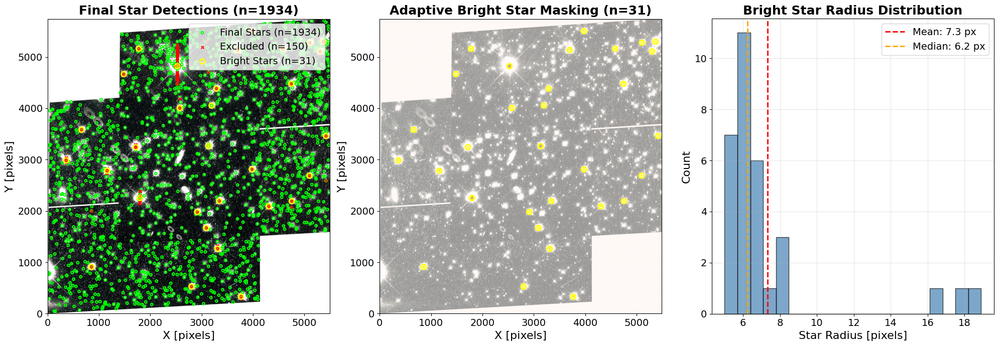

In [10]:
# Run the enhanced pipeline
final_V, excluded_V, bright_V, bright_radii_V, faint_V, spike_lines_V = run_star_detection_enhanced(
    mos_V, do_plot=True
)

PLOTTING 31 INDIVIDUAL BRIGHT STARS


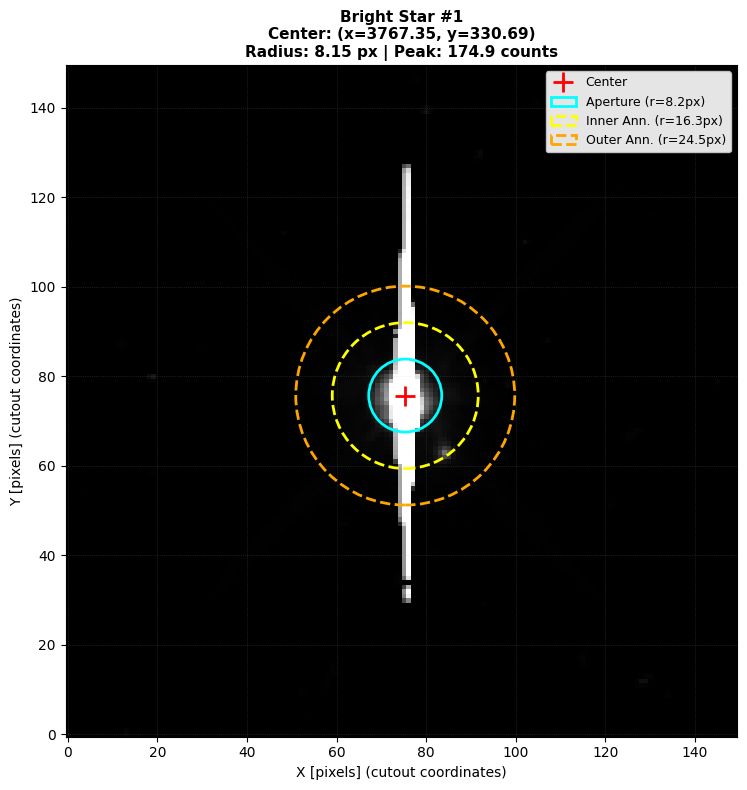

  Star #1: Center=(3767.35, 330.69), r=8.15px, Inner annulus=[16.30, 24.45]px


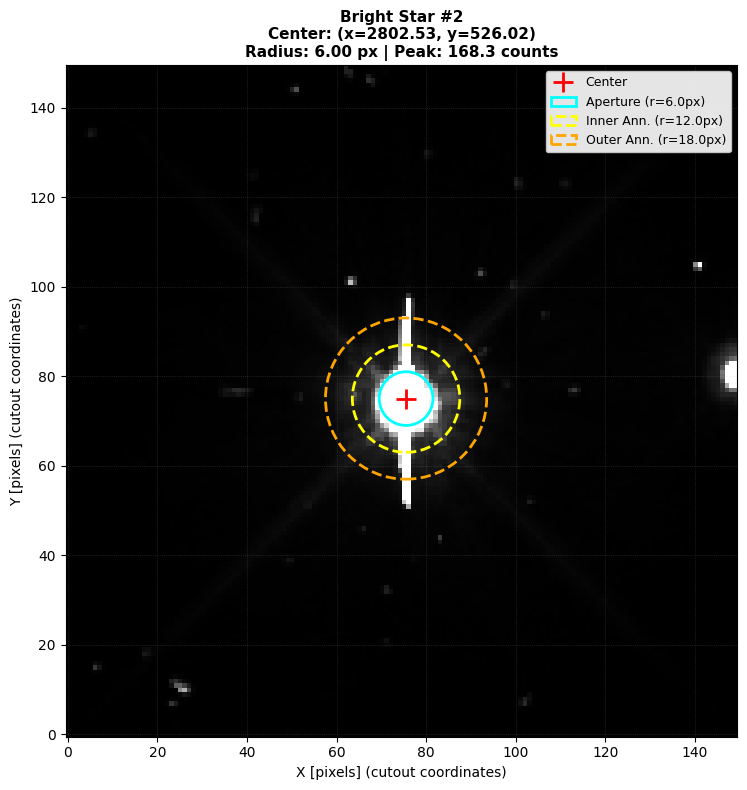

  Star #2: Center=(2802.53, 526.02), r=6.00px, Inner annulus=[12.00, 18.00]px


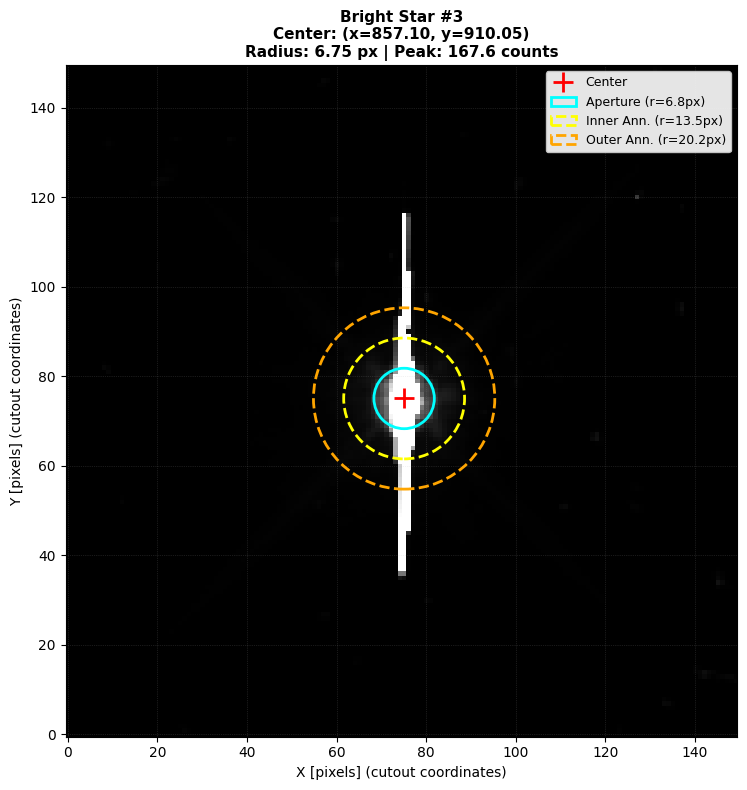

  Star #3: Center=(857.10, 910.05), r=6.75px, Inner annulus=[13.50, 20.25]px


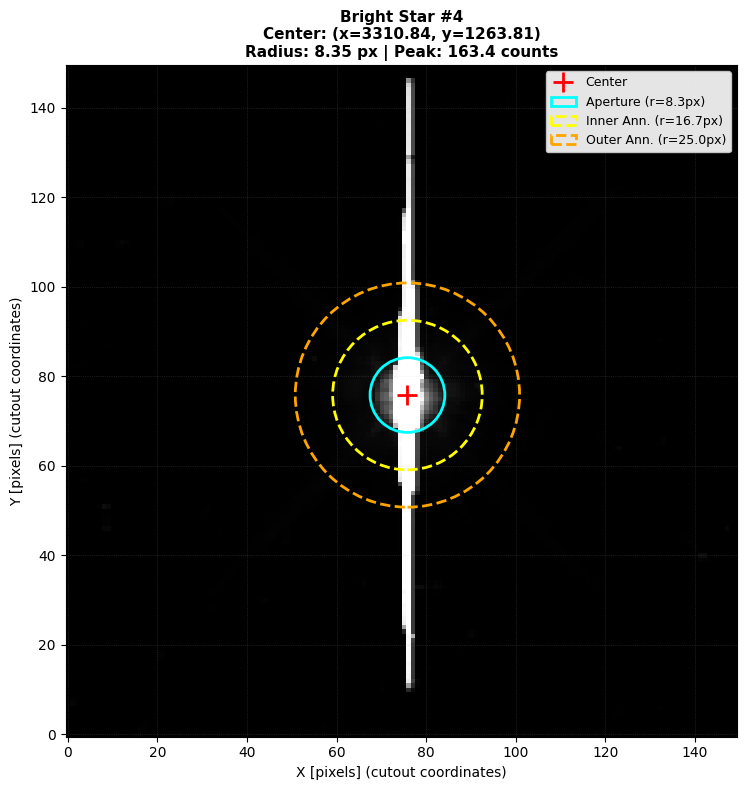

  Star #4: Center=(3310.84, 1263.81), r=8.35px, Inner annulus=[16.70, 25.05]px


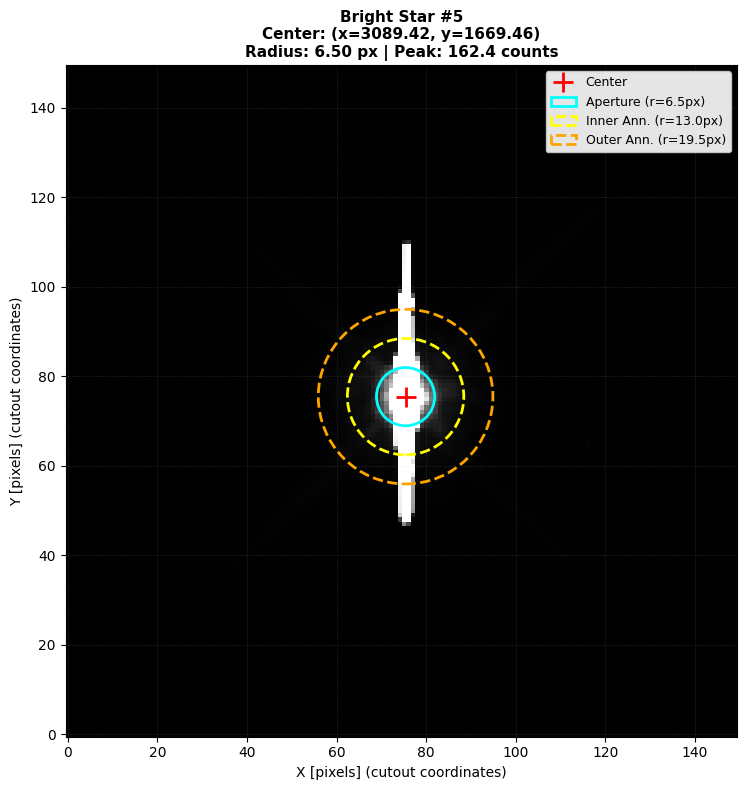

  Star #5: Center=(3089.42, 1669.46), r=6.50px, Inner annulus=[13.00, 19.50]px
  Star #6: Center=(2912.70, 1979.16), r=5.50px, Inner annulus=[11.00, 16.50]px
  Star #7: Center=(4307.51, 2090.75), r=6.75px, Inner annulus=[13.50, 20.25]px
  Star #8: Center=(4754.75, 2190.28), r=5.00px, Inner annulus=[10.00, 15.00]px
  Star #9: Center=(3342.27, 2192.57), r=6.50px, Inner annulus=[13.00, 19.50]px
  Star #10: Center=(1797.86, 2252.47), r=16.50px, Inner annulus=[33.00, 49.50]px
  Star #11: Center=(5098.46, 2686.60), r=5.00px, Inner annulus=[10.00, 15.00]px
  Star #12: Center=(1161.35, 2783.17), r=7.95px, Inner annulus=[15.90, 23.85]px
  Star #13: Center=(3977.24, 2810.34), r=6.30px, Inner annulus=[12.60, 18.90]px
  Star #14: Center=(363.46, 2986.80), r=7.10px, Inner annulus=[14.20, 21.30]px
  Star #15: Center=(1717.27, 3242.00), r=5.00px, Inner annulus=[10.00, 15.00]px
  Star #16: Center=(3134.30, 3263.29), r=17.80px, Inner annulus=[35.60, 53.40]px
  Star #17: Center=(5421.74, 3460.81), r=5.5

In [11]:
# Plot individual bright stars with photometry annuli
if bright_V is not None and len(bright_V) > 0:
    plot_individual_bright_stars(mos_V, bright_V, bright_radii_V, cutout_size=150)

## Computing photometry in each target exposure

Now we have a list of stellar positions in the master mosaic frame.

We'll want to do the photometry in the individual (calibrated, sky-subtracted) exposures.

Not all stars will appear in each exposure.  We will compute the coordinates of all stars in the frame of each exposure (using the frame offsets above), and only get photometry on those stars whose coordinates fall in the field of view.

Running star detection for V-band (F606W)
Star detection pipeline

[1/5] Initial bright star detection...
      Found 31 bright star candidates

[2/5] Refining bright stars with adaptive centering...

Refining 31 bright star candidates...
  Star 1: Refined to (3767.3, 330.7), radius=8.2 px (raw=8.0, methods=[9.0, 25.0, 7.5]), brightness=174.9
  Star 2: Refined to (2802.5, 526.0), radius=6.0 px (raw=23.0, methods=[7.5, 4.5, 22.0]), brightness=168.3
  Star 3: Refined to (857.1, 910.0), radius=6.8 px (raw=25.0, methods=[9.0, 4.5, 23.0]), brightness=167.6
  Star 4: Refined to (3310.8, 1263.8), radius=8.3 px (raw=7.0, methods=[11.5, 25.0, 7.0]), brightness=163.4
  Star 5: Refined to (3089.4, 1669.5), radius=6.5 px (raw=36.0, methods=[10.0, 3.0, 33.0]), brightness=162.4
  Star 6: Refined to (2912.7, 1979.2), radius=5.5 px (raw=34.0, methods=[7.5, 3.5, 31.0]), brightness=155.2
  Star 7: Refined to (4307.5, 2090.8), radius=6.8 px (raw=34.0, methods=[8.5, 5.0, 30.5]), brightness=238.5
  Star 8:

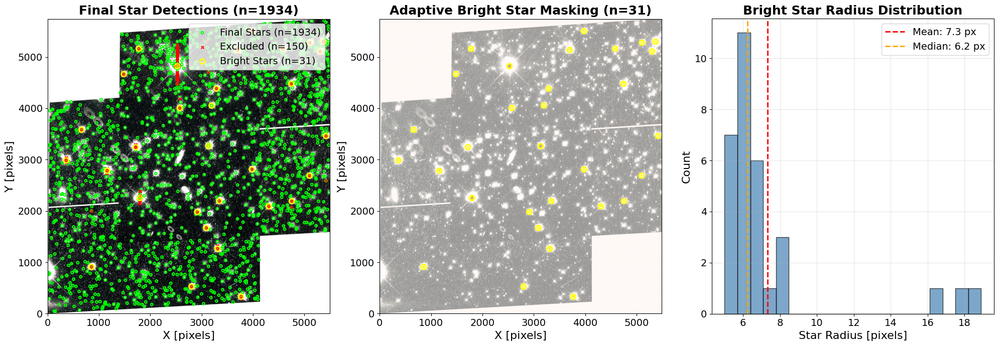

Running star detection for I-band (F814W)
Star detection pipeline

[1/5] Initial bright star detection...
      Found 13 bright star candidates

[2/5] Refining bright stars with adaptive centering...

Refining 13 bright star candidates...
  Star 1: Refined to (756.0, 811.0), radius=7.8 px (raw=17.0, methods=[10.0, 5.5, 15.5]), brightness=116.4
  Star 2: Refined to (3209.7, 1161.9), radius=7.2 px (raw=26.0, methods=[10.0, 4.5, 23.5]), brightness=119.7
  Star 3: Refined to (2988.4, 1569.9), radius=13.2 px (raw=15.0, methods=[10.0, 4.5, 14.0]), brightness=116.7
  Star 4: Refined to (4206.3, 1990.0), radius=8.6 px (raw=8.0, methods=[10.5, 4.5, 7.5]), brightness=119.3
  Star 5: Refined to (3241.2, 2095.1), radius=7.8 px (raw=32.0, methods=[10.0, 5.5, 30.0]), brightness=115.8
  Star 6: Refined to (1696.7, 2152.6), radius=9.0 px (raw=9.0, methods=[16.0, 9.0, 9.0]), brightness=117.0
  Star 7: Refined to (262.3, 2885.1), radius=7.4 px (raw=8.0, methods=[14.5, 6.5, 7.5]), brightness=106.0
  Star

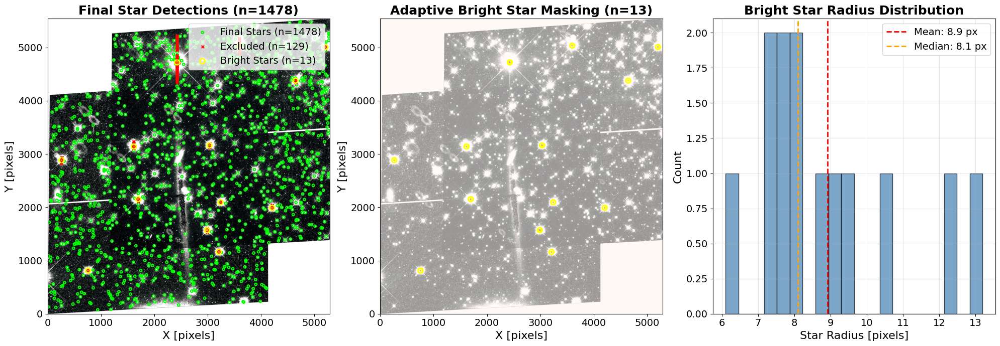


Star detection summary:
  V-band: 31 bright, 2053 faint
  I-band: 13 bright, 1594 faint


In [12]:
# Run star detection for both bands

print("Running star detection for V-band (F606W)")

final_V, excluded_V, bright_V, bright_radii_V, faint_V, spike_lines_V = run_star_detection_enhanced(
    mos_V, do_plot=True
)


print("Running star detection for I-band (F814W)")

final_I, excluded_I, bright_I, bright_radii_I, faint_I, spike_lines_I = run_star_detection_enhanced(
    mos_I, do_plot=True
)

# Get exposure times
exptime_V = calib_info['V']['exptime']
exptime_I = calib_info['I']['exptime']

print(f"\nStar detection summary:")
print(f"  V-band: {len(bright_V)} bright, {len(faint_V)} faint")
print(f"  I-band: {len(bright_I)} bright, {len(faint_I)} faint")

In [13]:
def do_aperture_photometry(image_dn, star_positions, exptime, 
                           ap_radius=3.0, sky_inner=6.0, sky_outer=9.0,
                           verbose=True):
    """
    Perform aperture photometry on a list of star positions.
    
    Parameters
    ----------
    image_dn : ndarray
        Image in DN (electrons)
    star_positions : ndarray
        Array of (y, x) positions, shape (N, 2)
    exptime : float
        Exposure time in seconds
    ap_radius, sky_inner, sky_outer : float
        Aperture and sky annulus radii in pixels
    verbose : bool
        Print progress info
        
    Returns
    -------
    flux : ndarray
        Flux in electrons/s
    flux_err : ndarray
        Flux error in electrons/s
    positions : ndarray
        Positions of successfully measured stars (x, y)
    stats : dict
        Statistics about skipped stars
    """
    n_stars = len(star_positions)
    flux_list = []
    flux_err_list = []
    pos_list = []
    
    stats = {'edge': 0, 'nan': 0, 'negative': 0, 'failed': 0}
    
    for j in range(n_stars):
        y_star, x_star = star_positions[j]
        
        margin = int(sky_outer + 5)
        if (y_star < margin or y_star >= image_dn.shape[0] - margin or
            x_star < margin or x_star >= image_dn.shape[1] - margin):
            stats['edge'] += 1
            continue
        
        try:
            result = a180.ap_phot(image_dn, x_star, y_star, ap_radius, sky_inner, sky_outer)
            
            if isinstance(result, tuple):
                f_dn, f_err_dn = result[0], result[1]
            else:
                f_dn = result
                f_err_dn = np.sqrt(np.abs(f_dn))
            
            f = f_dn / exptime
            f_err = f_err_dn / exptime
            
            if np.isnan(f) or np.isnan(f_err):
                stats['nan'] += 1
                continue
            
            if f <= 0:
                stats['negative'] += 1
                continue
            
            flux_list.append(f)
            flux_err_list.append(f_err)
            pos_list.append((x_star, y_star))
            
        except Exception as e:
            if verbose:
                print(f"  Warning: Star {j} at ({x_star:.1f}, {y_star:.1f}): {e}")
            stats['failed'] += 1
    
    return np.array(flux_list), np.array(flux_err_list), np.array(pos_list), stats

## Photometric calibration

We need to use the photometric standard star observations to calibrate the photometry into magnitudes, with associated error.

In [14]:
def flux_to_magnitudes(flux, flux_err, zp_vega, zp_err):
    """Convert flux to Vega magnitudes with errors."""
    vegamag = -2.5 * np.log10(flux) + zp_vega
    flux_mag_err = 1.0857 * (flux_err / flux)
    vegamag_err = np.sqrt(flux_mag_err**2 + zp_err**2)
    return vegamag, vegamag_err

## Aligning V and I bands

With the flux in V and I, they now need to be aligned so each star can be compared across the two bands and find the color later

In [15]:
def find_offset_from_bright_stars(bright_V, bright_I, image_V, image_I, 
                                   n_align=20, search_radius=200.0, verbose=True):
    """
    Find coordinate offset between V and I bands using bright stars.
    
    Parameters
    ----------
    bright_V, bright_I : ndarray
        Bright star positions (y, x) from each band
    image_V, image_I : ndarray
        Images for getting brightness values
    n_align : int
        Number of brightest stars to use
    search_radius : float
        Maximum distance for matching (pixels)
    verbose : bool
        Print progress info
        
    Returns
    -------
    offset_x, offset_y : float
        Offset (I - V) in pixels
    offset_x_err, offset_y_err : float
        Offset errors
    n_matched : int
        Number of matched pairs
    """
    # Get positions
    bright_x_V = bright_V[:, 1]
    bright_y_V = bright_V[:, 0]
    bright_x_I = bright_I[:, 1]
    bright_y_I = bright_I[:, 0]
    
    # Get brightness and sort
    bright_brightness_V = image_V[bright_V[:, 0].astype(int), bright_V[:, 1].astype(int)]
    bright_brightness_I = image_I[bright_I[:, 0].astype(int), bright_I[:, 1].astype(int)]
    
    sorted_idx_V = np.argsort(bright_brightness_V)[::-1]
    sorted_idx_I = np.argsort(bright_brightness_I)[::-1]
    
    n_use = min(n_align, len(bright_V), len(bright_I))
    
    align_x_V = bright_x_V[sorted_idx_V[:n_use]]
    align_y_V = bright_y_V[sorted_idx_V[:n_use]]
    align_x_I = bright_x_I[sorted_idx_I[:n_use]]
    align_y_I = bright_y_I[sorted_idx_I[:n_use]]
    
    # Match bright stars
    delta_x_list = []
    delta_y_list = []
    
    for i in range(n_use):
        xv, yv = align_x_V[i], align_y_V[i]
        distances = np.sqrt((align_x_I - xv)**2 + (align_y_I - yv)**2)
        min_idx = np.argmin(distances)
        min_dist = distances[min_idx]
        
        if min_dist < search_radius:
            xi, yi = align_x_I[min_idx], align_y_I[min_idx]
            delta_x_list.append(xi - xv)
            delta_y_list.append(yi - yv)
            if verbose:
                print(f"  Matched: V({xv:.1f}, {yv:.1f}) -> I({xi:.1f}, {yi:.1f}), dist={min_dist:.1f}")
    
    if len(delta_x_list) == 0:
        if verbose:
            print("  WARNING: No matching pairs found! Using offset = (0, 0)")
        return 0.0, 0.0, 0.0, 0.0, 0
    
    delta_x_list = np.array(delta_x_list)
    delta_y_list = np.array(delta_y_list)
    
    offset_x = np.median(delta_x_list)
    offset_y = np.median(delta_y_list)
    offset_x_err = np.std(delta_x_list) / np.sqrt(len(delta_x_list)) if len(delta_x_list) > 1 else 0.0
    offset_y_err = np.std(delta_y_list) / np.sqrt(len(delta_y_list)) if len(delta_y_list) > 1 else 0.0
    
    return offset_x, offset_y, offset_x_err, offset_y_err, len(delta_x_list)


def match_and_align_stars(positions_V, mag_V, mag_err_V,
                          positions_I, mag_I, mag_err_I,
                          offset_x, offset_y, match_sep=3.0):
    """
    Apply offset and match stars between V and I bands.
    
    Returns
    -------
    matched_data : dict
        Dictionary with matched star data
    """
    # Filter NaN/inf
    valid_V = (np.isfinite(positions_V[:, 0]) & np.isfinite(positions_V[:, 1]) & 
               np.isfinite(mag_V) & np.isfinite(mag_err_V))
    valid_I = (np.isfinite(positions_I[:, 0]) & np.isfinite(positions_I[:, 1]) & 
               np.isfinite(mag_I) & np.isfinite(mag_err_I))
    
    pos_V_x = positions_V[valid_V, 0]
    pos_V_y = positions_V[valid_V, 1]
    mag_V_clean = mag_V[valid_V]
    mag_err_V_clean = mag_err_V[valid_V]
    
    pos_I_x = positions_I[valid_I, 0]
    pos_I_y = positions_I[valid_I, 1]
    mag_I_clean = mag_I[valid_I]
    mag_err_I_clean = mag_err_I[valid_I]
    
    # Apply offset
    pos_V_x_shifted = pos_V_x + offset_x
    pos_V_y_shifted = pos_V_y + offset_y
    
    # Match stars
    matched = ms.match_stars(
        pos_V_x_shifted, pos_V_y_shifted, mag_V_clean, mag_err_V_clean,
        pos_I_x, pos_I_y, mag_I_clean, mag_err_I_clean,
        sep=match_sep, debug=False
    )
    
    # Unpack
    matched_x_V_shifted = matched[0, :]
    matched_y_V_shifted = matched[1, :]
    matched_mag_V = matched[2, :]
    matched_mag_err_V = matched[3, :]
    matched_x_I = matched[4, :]
    matched_y_I = matched[5, :]
    matched_mag_I = matched[6, :]
    matched_mag_err_I = matched[7, :]
    
    # Original V positions
    matched_x = matched_x_V_shifted - offset_x
    matched_y = matched_y_V_shifted - offset_y
    
    # Color
    color_VI = matched_mag_V - matched_mag_I
    color_VI_err = np.sqrt(matched_mag_err_V**2 + matched_mag_err_I**2)
    
    return {
        'x': matched_x, 'y': matched_y,
        'mag_V': matched_mag_V, 'mag_err_V': matched_mag_err_V,
        'mag_I': matched_mag_I, 'mag_err_I': matched_mag_err_I,
        'color': color_VI, 'color_err': color_VI_err,
        'n_valid_V': np.sum(valid_V), 'n_valid_I': np.sum(valid_I)
    }


def filter_by_errors(data, max_mag_err=0.1, max_color_err=0.15):
    """Filter matched data by error thresholds."""
    good_mask = ((data['mag_err_V'] < max_mag_err) & 
                 (data['mag_err_I'] < max_mag_err) & 
                 (data['color_err'] < max_color_err))
    
    good_data = {k: v[good_mask] if isinstance(v, np.ndarray) and len(v) == len(good_mask) else v 
                 for k, v in data.items()}
    bad_data = {k: v[~good_mask] if isinstance(v, np.ndarray) and len(v) == len(good_mask) else v 
                for k, v in data.items()}
    
    good_data['n_stars'] = np.sum(good_mask)
    bad_data['n_stars'] = np.sum(~good_mask)
    
    return good_data, bad_data

In [16]:
def run_full_photometry_pipeline(mos_V, mos_I, faint_V, faint_I, bright_V, bright_I,
                                  exptime_V, exptime_I, include_bright=False,
                                  faint_ap=1.5, faint_sky_in=5.0, faint_sky_out=10.0,
                                  bright_ap_scale=1.0, bright_sky_scale_in=2.0, 
                                  bright_sky_scale_out=3.0, bright_radii_V=None, 
                                  bright_radii_I=None, verbose=True):
    """
    Run the full photometry pipeline.
    
    Parameters
    ----------
    include_bright : bool
        If True, include bright stars in photometry (with adaptive apertures)
        If False, only use faint stars (bright stars only for alignment)
    """
    # Zeropoints
    zp_vega_F606W, zp_err_F606W = 26.0039, 0.0129
    zp_vega_F814W, zp_err_F814W = 24.6985, 0.0075
    
    # Convert to DN
    mos_V_dn = mos_V * exptime_V
    mos_I_dn = mos_I * exptime_I
    
    if verbose:
        
        mode = "including bright stars" if include_bright else "Faint stars only"
        print(f"Photometry pipeline - {mode}")
        
    
    # Determine which stars to use
    if include_bright:
        # Combine faint and bright stars
        stars_V = np.vstack([faint_V, bright_V])
        stars_I = np.vstack([faint_I, bright_I])
        
        # For bright stars, use adaptive apertures based on their radii
        if bright_radii_V is None:
            bright_radii_V = np.ones(len(bright_V)) * 10.0
        if bright_radii_I is None:
            bright_radii_I = np.ones(len(bright_I)) * 10.0
        
        if verbose:
            print(f"\nV-band: {len(faint_V)} faint + {len(bright_V)} bright = {len(stars_V)} total")
            print(f"I-band: {len(faint_I)} faint + {len(bright_I)} bright = {len(stars_I)} total")
    else:
        stars_V = faint_V
        stars_I = faint_I
        if verbose:
            print(f"\nV-band: {len(faint_V)} faint stars (bright excluded)")
            print(f"I-band: {len(faint_I)} faint stars (bright excluded)")
    
    # V-band photometry
    if verbose:
        print(f"\n--- V-band photometry ---")
    
    if include_bright:
        # Do photometry separately for faint and bright, then combine
        flux_V_faint, err_V_faint, pos_V_faint, stats_faint = do_aperture_photometry(
            mos_V_dn, faint_V, exptime_V, faint_ap, faint_sky_in, faint_sky_out, verbose=False)
        
        # Bright stars with adaptive apertures
        flux_V_bright_list, err_V_bright_list, pos_V_bright_list = [], [], []
        for i, (pos, rad) in enumerate(zip(bright_V, bright_radii_V)):
            ap_r = rad * bright_ap_scale
            sky_in = rad * bright_sky_scale_in
            sky_out = rad * bright_sky_scale_out
            f, e, p, _ = do_aperture_photometry(
                mos_V_dn, pos.reshape(1, 2), exptime_V, ap_r, sky_in, sky_out, verbose=False)
            if len(f) > 0:
                flux_V_bright_list.append(f[0])
                err_V_bright_list.append(e[0])
                pos_V_bright_list.append(p[0])
        
        if len(flux_V_bright_list) > 0:
            flux_V = np.concatenate([flux_V_faint, flux_V_bright_list])
            flux_err_V = np.concatenate([err_V_faint, err_V_bright_list])
            positions_V = np.vstack([pos_V_faint, pos_V_bright_list])
        else:
            flux_V, flux_err_V, positions_V = flux_V_faint, err_V_faint, pos_V_faint
        stats_V = stats_faint
    else:
        flux_V, flux_err_V, positions_V, stats_V = do_aperture_photometry(
            mos_V_dn, faint_V, exptime_V, faint_ap, faint_sky_in, faint_sky_out, verbose=False)
    
    if verbose:
        print(f"  Valid: {len(flux_V)}, Edge: {stats_V['edge']}, NaN: {stats_V['nan']}, Neg: {stats_V['negative']}")
    
    # I-band photometry
    if verbose:
        print(f"\n--- I-band photometry ---")
    
    if include_bright:
        flux_I_faint, err_I_faint, pos_I_faint, stats_faint = do_aperture_photometry(
            mos_I_dn, faint_I, exptime_I, faint_ap, faint_sky_in, faint_sky_out, verbose=False)
        
        flux_I_bright_list, err_I_bright_list, pos_I_bright_list = [], [], []
        for i, (pos, rad) in enumerate(zip(bright_I, bright_radii_I)):
            ap_r = rad * bright_ap_scale
            sky_in = rad * bright_sky_scale_in
            sky_out = rad * bright_sky_scale_out
            f, e, p, _ = do_aperture_photometry(
                mos_I_dn, pos.reshape(1, 2), exptime_I, ap_r, sky_in, sky_out, verbose=False)
            if len(f) > 0:
                flux_I_bright_list.append(f[0])
                err_I_bright_list.append(e[0])
                pos_I_bright_list.append(p[0])
        
        if len(flux_I_bright_list) > 0:
            flux_I = np.concatenate([flux_I_faint, flux_I_bright_list])
            flux_err_I = np.concatenate([err_I_faint, err_I_bright_list])
            positions_I = np.vstack([pos_I_faint, pos_I_bright_list])
        else:
            flux_I, flux_err_I, positions_I = flux_I_faint, err_I_faint, pos_I_faint
        stats_I = stats_faint
    else:
        flux_I, flux_err_I, positions_I, stats_I = do_aperture_photometry(
            mos_I_dn, faint_I, exptime_I, faint_ap, faint_sky_in, faint_sky_out, verbose=False)
    
    if verbose:
        print(f"  Valid: {len(flux_I)}, Edge: {stats_I['edge']}, NaN: {stats_I['nan']}, Neg: {stats_I['negative']}")
    
    # Convert to magnitudes
    mag_V, mag_err_V = flux_to_magnitudes(flux_V, flux_err_V, zp_vega_F606W, zp_err_F606W)
    mag_I, mag_err_I = flux_to_magnitudes(flux_I, flux_err_I, zp_vega_F814W, zp_err_F814W)
    
    if verbose:
        print(f"\n--- Magnitudes ---")
        print(f"  V range: {np.min(mag_V):.2f} to {np.max(mag_V):.2f}")
        print(f"  I range: {np.min(mag_I):.2f} to {np.max(mag_I):.2f}")
    
    # Find offset using bright stars (always)
    if verbose:
        print(f"\n--- Finding offset using BRIGHT stars ---")
    offset_x, offset_y, offset_x_err, offset_y_err, n_matched = find_offset_from_bright_stars(
        bright_V, bright_I, mos_V, mos_I, n_align=20, verbose=verbose)
    
    if verbose:
        print(f"\n  Offset: ({offset_x:.3f} +/- {offset_x_err:.3f}, {offset_y:.3f} +/- {offset_y_err:.3f}) px")
    
    # Match stars
    if verbose:
        print(f"\n--- Matching stars ---")
    matched = match_and_align_stars(
        positions_V, mag_V, mag_err_V,
        positions_I, mag_I, mag_err_I,
        offset_x, offset_y, match_sep=3.0)
    
    if verbose:
        print(f"  Matched: {len(matched['mag_V'])} stars")
        print(f"  Color range: {np.min(matched['color']):.2f} to {np.max(matched['color']):.2f}")
    
    return {
        'matched': matched,
        'offset': (offset_x, offset_y, offset_x_err, offset_y_err),
        'flux_V': flux_V, 'flux_err_V': flux_err_V, 'positions_V': positions_V,
        'flux_I': flux_I, 'flux_err_I': flux_err_I, 'positions_I': positions_I,
        'mag_V': mag_V, 'mag_err_V': mag_err_V,
        'mag_I': mag_I, 'mag_err_I': mag_err_I,
        'include_bright': include_bright
    }

In [17]:
results_faint_only = run_full_photometry_pipeline(
    mos_V, mos_I, 
    faint_V, faint_I, 
    bright_V, bright_I,
    exptime_V, exptime_I,
    include_bright=False,
    bright_radii_V=bright_radii_V,
    bright_radii_I=bright_radii_I,
    verbose=True
)

Photometry pipeline - Faint stars only

V-band: 2053 faint stars (bright excluded)
I-band: 1594 faint stars (bright excluded)

--- V-band photometry ---
  Valid: 1995, Edge: 2, NaN: 12, Neg: 44

--- I-band photometry ---
  Valid: 1558, Edge: 2, NaN: 9, Neg: 25

--- Magnitudes ---
  V range: 18.04 to 26.93
  I range: 17.50 to 25.71

--- Finding offset using BRIGHT stars ---
  Matched: V(4307.5, 2090.8) -> I(4206.3, 1990.0), dist=142.8
  Matched: V(5305.1, 5109.2) -> I(5204.0, 5010.0), dist=141.6
  Matched: V(3698.0, 5136.0) -> I(3596.9, 5036.0), dist=142.2
  Matched: V(4745.8, 4477.9) -> I(4644.6, 4378.8), dist=141.6

  Offset: (-101.127 +/- 0.016, -99.635 +/- 0.348) px

--- Matching stars ---
  Matched: 957 stars
  Color range: -0.05 to 2.43


In [18]:
results_with_bright = run_full_photometry_pipeline(
    mos_V, mos_I, 
    faint_V, faint_I, 
    bright_V, bright_I,
    exptime_V, exptime_I,
    include_bright=True,
    bright_radii_V=bright_radii_V,
    bright_radii_I=bright_radii_I,
    verbose=True
)

Photometry pipeline - including bright stars

V-band: 2053 faint + 31 bright = 2084 total
I-band: 1594 faint + 13 bright = 1607 total

--- V-band photometry ---
  Valid: 2026, Edge: 2, NaN: 12, Neg: 44

--- I-band photometry ---
  Valid: 1571, Edge: 2, NaN: 9, Neg: 25

--- Magnitudes ---
  V range: 13.45 to 26.93
  I range: 13.31 to 25.71

--- Finding offset using BRIGHT stars ---
  Matched: V(4307.5, 2090.8) -> I(4206.3, 1990.0), dist=142.8
  Matched: V(5305.1, 5109.2) -> I(5204.0, 5010.0), dist=141.6
  Matched: V(3698.0, 5136.0) -> I(3596.9, 5036.0), dist=142.2
  Matched: V(4745.8, 4477.9) -> I(4644.6, 4378.8), dist=141.6

  Offset: (-101.127 +/- 0.016, -99.635 +/- 0.348) px

--- Matching stars ---
  Matched: 986 stars
  Color range: -2.71 to 2.43


## Color-Magnitude Diagram

Now that we have the photometry for each star in magnitudes (with errors), we can compute the color magnitude diagram, with errorbars.

In [19]:
def plot_cmd_comparison(results_faint, results_bright, max_mag_err=0.1, max_color_err=0.15):
    """Plot CMDs comparing faint-only vs including bright stars with detailed error analysis."""
    
    good_data_faint, bad_data_faint = filter_by_errors(
        results_faint['matched'], max_mag_err, max_color_err
    )
    
    good_data_bright, bad_data_bright = filter_by_errors(
        results_bright['matched'], max_mag_err, max_color_err
    )
    
    # Extract arrays for plotting - GOOD stars
    color_good_faint = good_data_faint['color']
    mag_V_good_faint = good_data_faint['mag_V']
    mag_I_good_faint = good_data_faint['mag_I']
    color_err_good_faint = good_data_faint['color_err']
    mag_err_V_good_faint = good_data_faint['mag_err_V']
    mag_err_I_good_faint = good_data_faint['mag_err_I']
    
    color_good_bright = good_data_bright['color']
    mag_V_good_bright = good_data_bright['mag_V']
    mag_I_good_bright = good_data_bright['mag_I']
    color_err_good_bright = good_data_bright['color_err']
    mag_err_V_good_bright = good_data_bright['mag_err_V']
    mag_err_I_good_bright = good_data_bright['mag_err_I']
    
    # Extract arrays for plotting - BAD stars
    color_bad_faint = bad_data_faint['color']
    mag_V_bad_faint = bad_data_faint['mag_V']
    mag_I_bad_faint = bad_data_faint['mag_I']
    
    color_bad_bright = bad_data_bright['color']
    mag_V_bad_bright = bad_data_bright['mag_V']
    mag_I_bad_bright = bad_data_bright['mag_I']
    
    # Get full datasets for error distributions
    mag_V_faint = results_faint['matched']['mag_V']
    mag_I_faint = results_faint['matched']['mag_I']
    color_faint = results_faint['matched']['color']
    mag_err_V_faint = results_faint['matched']['mag_err_V']
    mag_err_I_faint = results_faint['matched']['mag_err_I']
    color_err_faint = results_faint['matched']['color_err']
    
    mag_V_bright = results_bright['matched']['mag_V']
    mag_I_bright = results_bright['matched']['mag_I']
    color_bright = results_bright['matched']['color']
    mag_err_V_bright = results_bright['matched']['mag_err_V']
    mag_err_I_bright = results_bright['matched']['mag_err_I']
    color_err_bright = results_bright['matched']['color_err']
    
    # Plot 1: Side-by-side CMDs with error bars - GOOD STARS ONLY
    fig, axes = plt.subplots(2, 2, figsize=(18, 16))
    
    # Top row: V vs (V-I)
    ax = axes[0, 0]
    ax.errorbar(color_good_faint, mag_V_good_faint, 
                xerr=color_err_good_faint, yerr=mag_err_V_good_faint,
                fmt='o', markersize=5, alpha=0.7, 
                elinewidth=1.2, capsize=3, capthick=1.5,
                color='royalblue', ecolor='black', markeredgecolor='black', markeredgewidth=0.5,
                label=f'Faint only (n={len(color_good_faint)})')
    ax.set_xlabel('V - I (F606W - F814W) [Vega mag]', fontsize=13, fontweight='bold')
    ax.set_ylabel('V (F606W) [Vega mag]', fontsize=13, fontweight='bold')
    ax.set_title(f'CMD: Faint Stars Only\n(V_err < {max_mag_err}, color_err < {max_color_err})', 
                 fontsize=14, fontweight='bold')
    ax.invert_yaxis()
    ax.grid(True, alpha=0.3, linestyle='--', linewidth=1)
    ax.legend(loc='upper left', fontsize=12, framealpha=0.9)
    
    ax = axes[0, 1]
    ax.errorbar(color_good_bright, mag_V_good_bright, 
                xerr=color_err_good_bright, yerr=mag_err_V_good_bright,
                fmt='o', markersize=5, alpha=0.7, 
                elinewidth=1.2, capsize=3, capthick=1.5,
                color='firebrick', ecolor='black', markeredgecolor='black', markeredgewidth=0.5,
                label=f'Faint + Bright (n={len(color_good_bright)})')
    ax.set_xlabel('V - I (F606W - F814W) [Vega mag]', fontsize=13, fontweight='bold')
    ax.set_ylabel('V (F606W) [Vega mag]', fontsize=13, fontweight='bold')
    ax.set_title(f'CMD: Including Bright Stars\n(V_err < {max_mag_err}, color_err < {max_color_err})', 
                 fontsize=14, fontweight='bold')
    ax.invert_yaxis()
    ax.grid(True, alpha=0.3, linestyle='--', linewidth=1)
    ax.legend(loc='upper left', fontsize=12, framealpha=0.9)
    
    # Bottom row: I vs (V-I)
    ax = axes[1, 0]
    ax.errorbar(color_good_faint, mag_I_good_faint, 
                xerr=color_err_good_faint, yerr=mag_err_I_good_faint,
                fmt='o', markersize=5, alpha=0.7, 
                elinewidth=1.2, capsize=3, capthick=1.5,
                color='royalblue', ecolor='black', markeredgecolor='black', markeredgewidth=0.5,
                label=f'Faint only (n={len(color_good_faint)})')
    ax.set_xlabel('V - I (F606W - F814W) [Vega mag]', fontsize=13, fontweight='bold')
    ax.set_ylabel('I (F814W) [Vega mag]', fontsize=13, fontweight='bold')
    ax.set_title(f'CMD: Faint Stars Only\n(I_err < {max_mag_err}, color_err < {max_color_err})', 
                 fontsize=14, fontweight='bold')
    ax.invert_yaxis()
    ax.grid(True, alpha=0.3, linestyle='--', linewidth=1)
    ax.legend(loc='upper left', fontsize=12, framealpha=0.9)
    
    ax = axes[1, 1]
    ax.errorbar(color_good_bright, mag_I_good_bright, 
                xerr=color_err_good_bright, yerr=mag_err_I_good_bright,
                fmt='o', markersize=5, alpha=0.7, 
                elinewidth=1.2, capsize=3, capthick=1.5,
                color='firebrick', ecolor='black', markeredgecolor='black', markeredgewidth=0.5,
                label=f'Faint + Bright (n={len(color_good_bright)})')
    ax.set_xlabel('V - I (F606W - F814W) [Vega mag]', fontsize=13, fontweight='bold')
    ax.set_ylabel('I (F814W) [Vega mag]', fontsize=13, fontweight='bold')
    ax.set_title(f'CMD: Including Bright Stars\n(I_err < {max_mag_err}, color_err < {max_color_err})', 
                 fontsize=14, fontweight='bold')
    ax.invert_yaxis()
    ax.grid(True, alpha=0.3, linestyle='--', linewidth=1)
    ax.legend(loc='upper left', fontsize=12, framealpha=0.9)
    
    plt.tight_layout()
    plt.savefig(images_dir + 'good_CMD.png', dpi=300)
    plt.show()
    
    # Plot 2: Overlay comparison showing both datasets together
    fig, axes = plt.subplots(1, 2, figsize=(18, 8))
    
    ax = axes[0]
    # Plot faint stars
    ax.scatter(color_bad_faint, mag_V_bad_faint, 
               s=40, alpha=0.5, c='red', marker='x', linewidths=2,
               label=f'Faint rejected (n={len(color_bad_faint)})')
    ax.errorbar(color_good_faint, mag_V_good_faint, 
                xerr=color_err_good_faint, yerr=mag_err_V_good_faint,
                fmt='o', markersize=5, alpha=0.6, 
                elinewidth=1.2, capsize=3, capthick=1.5,
                color='royalblue', ecolor='black', markeredgecolor='black', markeredgewidth=0.5,
                label=f'Faint good (n={len(color_good_faint)})')
    # Overlay bright stars
    ax.scatter(color_bad_bright, mag_V_bad_bright, 
               s=40, alpha=0.3, c='orange', marker='+', linewidths=2,
               label=f'Bright rejected (n={len(color_bad_bright)})')
    ax.errorbar(color_good_bright, mag_V_good_bright, 
                xerr=color_err_good_bright, yerr=mag_err_V_good_bright,
                fmt='s', markersize=4, alpha=0.4, 
                elinewidth=1.0, capsize=2, capthick=1.2,
                color='firebrick', ecolor='gray', markeredgecolor='black', markeredgewidth=0.5,
                label=f'Bright good (n={len(color_good_bright)})')
    ax.set_xlabel('V - I (F606W - F814W) [Vega mag]', fontsize=13, fontweight='bold')
    ax.set_ylabel('V (F606W) [Vega mag]', fontsize=13, fontweight='bold')
    ax.set_title('V-band CMD Comparison (Overlay)\nFaint vs Faint+Bright', fontsize=14, fontweight='bold')
    ax.invert_yaxis()
    ax.grid(True, alpha=0.3, linestyle='--', linewidth=1)
    ax.legend(loc='upper left', fontsize=12, framealpha=0.9)
    
    ax = axes[1]
    # Plot faint stars
    ax.scatter(color_bad_faint, mag_I_bad_faint, 
               s=40, alpha=0.5, c='red', marker='x', linewidths=2,
               label=f'Faint rejected (n={len(color_bad_faint)})')
    ax.errorbar(color_good_faint, mag_I_good_faint, 
                xerr=color_err_good_faint, yerr=mag_err_I_good_faint,
                fmt='o', markersize=5, alpha=0.6, 
                elinewidth=1.2, capsize=3, capthick=1.5,
                color='royalblue', ecolor='black', markeredgecolor='black', markeredgewidth=0.5,
                label=f'Faint good (n={len(color_good_faint)})')
    # Overlay bright stars
    ax.scatter(color_bad_bright, mag_I_bad_bright, 
               s=40, alpha=0.3, c='orange', marker='+', linewidths=2,
               label=f'Bright rejected (n={len(color_bad_bright)})')
    ax.errorbar(color_good_bright, mag_I_good_bright, 
                xerr=color_err_good_bright, yerr=mag_err_I_good_bright,
                fmt='s', markersize=4, alpha=0.4, 
                elinewidth=1.0, capsize=2, capthick=1.2,
                color='firebrick', ecolor='gray', markeredgecolor='black', markeredgewidth=0.5,
                label=f'Bright good (n={len(color_good_bright)})')
    ax.set_xlabel('V - I (F606W - F814W) [Vega mag]', fontsize=13, fontweight='bold')
    ax.set_ylabel('I (F814W) [Vega mag]', fontsize=13, fontweight='bold')
    ax.set_title('I-band CMD Comparison (Overlay)\nFaint vs Faint+Bright', fontsize=14, fontweight='bold')
    ax.invert_yaxis()
    ax.grid(True, alpha=0.3, linestyle='--', linewidth=1)
    ax.legend(loc='upper left', fontsize=12, framealpha=0.9)
    
    plt.tight_layout()
    plt.savefig(images_dir + 'compare_CMD.png', dpi=300)
    plt.show()
    
    # Plot 3: Error distribution comparison
    fig, axes = plt.subplots(2, 3, figsize=(18, 12))
    
    # V magnitude error distributions
    axes[0, 0].hist(mag_err_V_faint, bins=50, color='blue', alpha=0.5, 
                     edgecolor='black', label='Faint only')
    axes[0, 0].hist(mag_err_V_bright, bins=50, color='red', alpha=0.5, 
                     edgecolor='black', label='Faint + Bright')
    axes[0, 0].axvline(max_mag_err, color='black', linestyle='--', linewidth=2.5,
                        label=f'Threshold: {max_mag_err}')
    axes[0, 0].set_xlabel('V Magnitude Error [mag]', fontsize=14)
    axes[0, 0].set_ylabel('Count', fontsize=14)
    axes[0, 0].set_title('V-band Error Distribution', fontsize=16, fontweight='bold')
    axes[0, 0].set_yscale('log')
    axes[0, 0].legend(fontsize=12)
    axes[0, 0].grid(True, alpha=0.3)
    
    # I magnitude error distributions
    axes[0, 1].hist(mag_err_I_faint, bins=50, color='blue', alpha=0.5, 
                     edgecolor='black', label='Faint only')
    axes[0, 1].hist(mag_err_I_bright, bins=50, color='red', alpha=0.5, 
                     edgecolor='black', label='Faint + Bright')
    axes[0, 1].axvline(max_mag_err, color='black', linestyle='--', linewidth=2.5,
                        label=f'Threshold: {max_mag_err}')
    axes[0, 1].set_xlabel('I Magnitude Error [mag]', fontsize=14)
    axes[0, 1].set_ylabel('Count', fontsize=14)
    axes[0, 1].set_title('I-band Error Distribution', fontsize=16, fontweight='bold')
    axes[0, 1].set_yscale('log')
    axes[0, 1].legend(fontsize=12)
    axes[0, 1].grid(True, alpha=0.3)
    
    # Color error distributions
    axes[0, 2].hist(color_err_faint, bins=50, color='blue', alpha=0.5, 
                     edgecolor='black', label='Faint only')
    axes[0, 2].hist(color_err_bright, bins=50, color='red', alpha=0.5, 
                     edgecolor='black', label='Faint + Bright')
    axes[0, 2].axvline(max_color_err, color='black', linestyle='--', linewidth=2.5,
                        label=f'Threshold: {max_color_err}')
    axes[0, 2].set_xlabel('Color (V-I) Error [mag]', fontsize=14)
    axes[0, 2].set_ylabel('Count', fontsize=14)
    axes[0, 2].set_title('Color Error Distribution', fontsize=16, fontweight='bold')
    axes[0, 2].set_yscale('log')
    axes[0, 2].legend(fontsize=12)
    axes[0, 2].grid(True, alpha=0.3)
    
    # Error vs magnitude - Faint only
    axes[1, 0].scatter(mag_V_faint, mag_err_V_faint, s=10, alpha=0.4, c='blue', label='V error')
    axes[1, 0].scatter(mag_I_faint, mag_err_I_faint, s=10, alpha=0.4, c='red', label='I error')
    axes[1, 0].axhline(max_mag_err, color='black', linestyle='--', linewidth=2.5,
                        label=f'Threshold: {max_mag_err}')
    axes[1, 0].set_xlabel('Magnitude [mag]', fontsize=14)
    axes[1, 0].set_ylabel('Magnitude Error [mag]', fontsize=14)
    axes[1, 0].set_title('Error vs Magnitude (Faint Only)', fontsize=16, fontweight='bold')
    axes[1, 0].set_yscale('log')
    axes[1, 0].legend(fontsize=12)
    axes[1, 0].grid(True, alpha=0.3)
    
    # Error vs magnitude - Faint + Bright
    axes[1, 1].scatter(mag_V_bright, mag_err_V_bright, s=10, alpha=0.4, c='blue', label='V error')
    axes[1, 1].scatter(mag_I_bright, mag_err_I_bright, s=10, alpha=0.4, c='red', label='I error')
    axes[1, 1].axhline(max_mag_err, color='black', linestyle='--', linewidth=2.5,
                        label=f'Threshold: {max_mag_err}')
    axes[1, 1].set_xlabel('Magnitude [mag]', fontsize=12)
    axes[1, 1].set_ylabel('Magnitude Error [mag]', fontsize=12)
    axes[1, 1].set_title('Error vs Magnitude (Faint + Bright)', fontsize=16, fontweight='bold')
    axes[1, 1].set_yscale('log')
    axes[1, 1].legend(fontsize=12)
    axes[1, 1].grid(True, alpha=0.3)
    
    # Magnitude distributions
    axes[1, 2].hist(mag_V_faint, bins=50, color='blue', alpha=0.5, 
                     edgecolor='black', label='Faint only V')
    axes[1, 2].hist(mag_V_bright, bins=50, color='red', alpha=0.5, 
                     edgecolor='black', label='Faint + Bright V')
    axes[1, 2].set_xlabel('V Magnitude [mag]', fontsize=14)
    axes[1, 2].set_ylabel('Count', fontsize=14)
    axes[1, 2].set_title('V Magnitude Distribution', fontsize=16, fontweight='bold')
    axes[1, 2].legend(fontsize=12)
    axes[1, 2].grid(True, alpha=0.3)
    
    plt.tight_layout()
    plt.savefig(images_dir + 'error_CMD.png', dpi=300)
    plt.show()
    
    # Print detailed statistics
    
    print("COMPARISON STATISTICS")
    print("="*60)
    
    print(f"\nFAINT ONLY Dataset:")
    print(f"  Total stars: {len(mag_V_faint)}")
    print(f"  Good stars: {len(color_good_faint)} ({100*len(color_good_faint)/len(mag_V_faint):.1f}%)")
    print(f"  Rejected: {len(color_bad_faint)} ({100*len(color_bad_faint)/len(mag_V_faint):.1f}%)")
    print(f"  Mean V error: {np.mean(mag_err_V_faint):.4f} mag")
    print(f"  Mean I error: {np.mean(mag_err_I_faint):.4f} mag")
    print(f"  Mean color error: {np.mean(color_err_faint):.4f} mag")
    
    print(f"\nFAINT + BRIGHT Dataset:")
    print(f"  Total stars: {len(mag_V_bright)}")
    print(f"  Good stars: {len(color_good_bright)} ({100*len(color_good_bright)/len(mag_V_bright):.1f}%)")
    print(f"  Rejected: {len(color_bad_bright)} ({100*len(color_bad_bright)/len(mag_V_bright):.1f}%)")
    print(f"  Mean V error: {np.mean(mag_err_V_bright):.4f} mag")
    print(f"  Mean I error: {np.mean(mag_err_I_bright):.4f} mag")
    print(f"  Mean color error: {np.mean(color_err_bright):.4f} mag")
    
    print(f"\nDIFFERENCE:")
    print(f"  Additional total stars: {len(mag_V_bright) - len(mag_V_faint)}")
    print(f"  Additional good stars: {len(color_good_bright) - len(color_good_faint)}")
    
    return {
        'faint': {
            'color_good': color_good_faint,
            'mag_V_good': mag_V_good_faint,
            'mag_I_good': mag_I_good_faint,
            'n_good': len(color_good_faint),
            'n_total': len(mag_V_faint)
        },
        'bright': {
            'color_good': color_good_bright,
            'mag_V_good': mag_V_good_bright,
            'mag_I_good': mag_I_good_bright,
            'n_good': len(color_good_bright),
            'n_total': len(mag_V_bright)
        }
    }

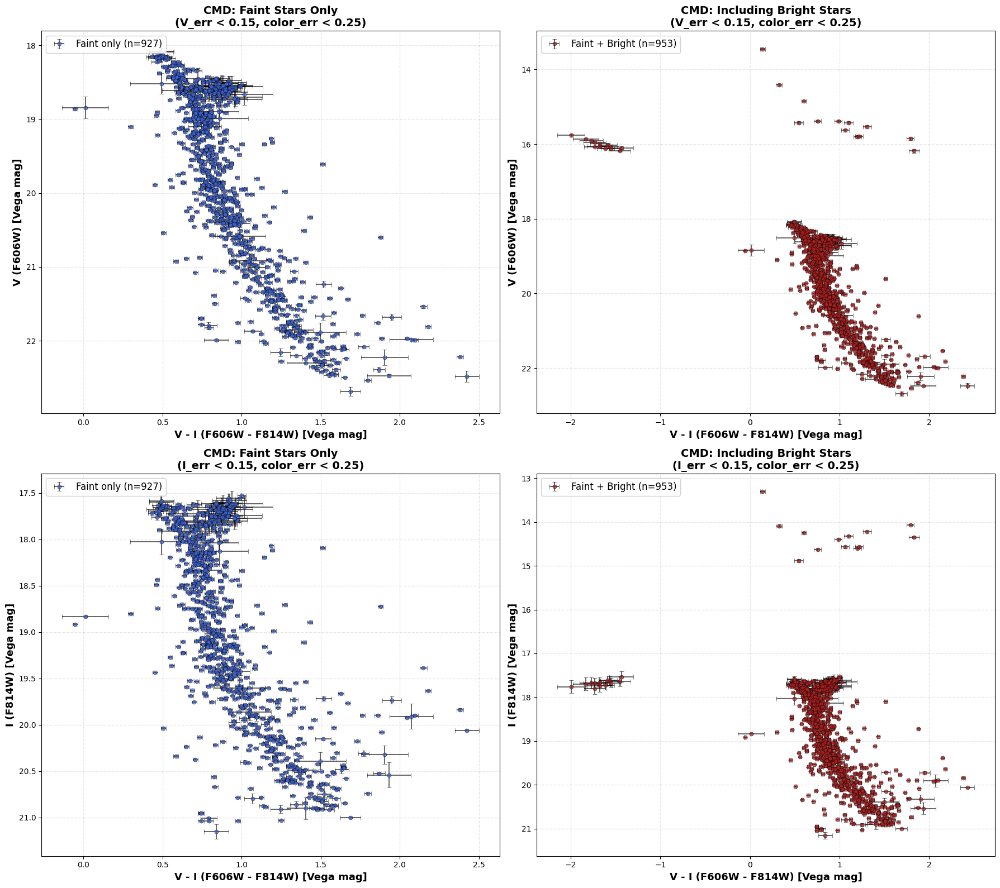

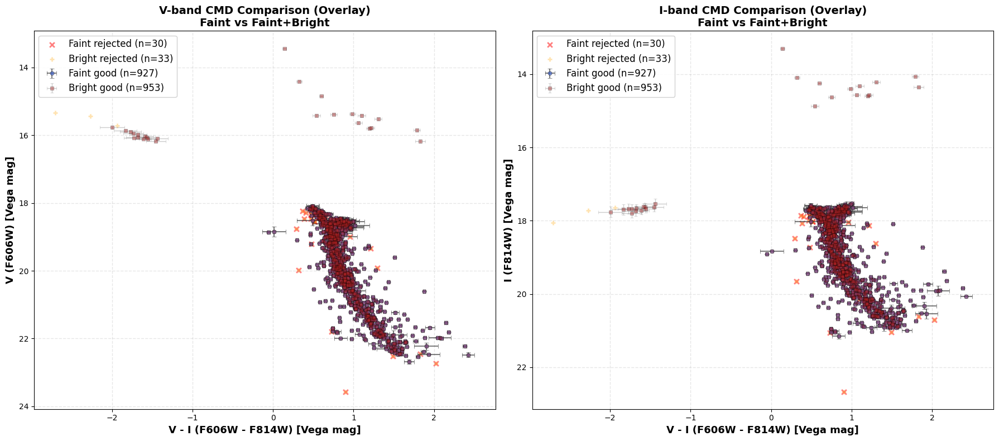

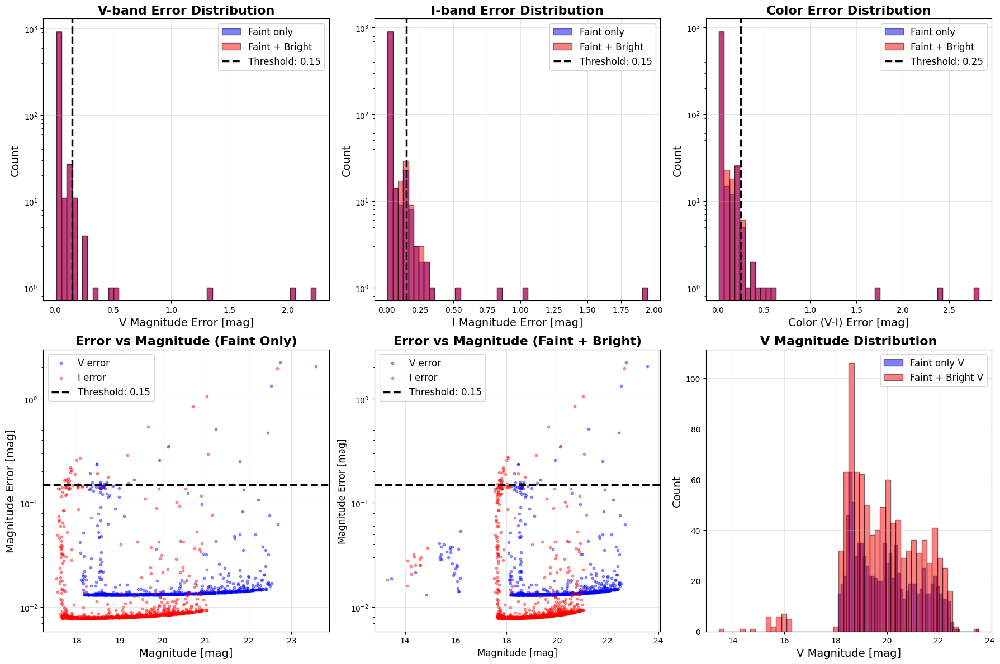

COMPARISON STATISTICS

FAINT ONLY Dataset:
  Total stars: 957
  Good stars: 927 (96.9%)
  Rejected: 30 (3.1%)
  Mean V error: 0.0285 mag
  Mean I error: 0.0226 mag
  Mean color error: 0.0374 mag

FAINT + BRIGHT Dataset:
  Total stars: 986
  Good stars: 953 (96.7%)
  Rejected: 33 (3.3%)
  Mean V error: 0.0285 mag
  Mean I error: 0.0245 mag
  Mean color error: 0.0391 mag

DIFFERENCE:
  Additional total stars: 29
  Additional good stars: 26


In [20]:
# Filter parameters
max_mag_err = 0.15
max_color_err = 0.25

good_faint, good_bright = plot_cmd_comparison(
    results_faint_only, results_with_bright,
    max_mag_err=max_mag_err, max_color_err=max_color_err
)

In [21]:
use_bright = False

if use_bright:
    print("Using results with bright stars")
    matched_data = results_with_bright['matched']
    good_data, bad_data = filter_by_errors(matched_data, max_mag_err, max_color_err)
else:
    print("Using results with faint stars only")
    matched_data = results_faint_only['matched']
    good_data, bad_data = filter_by_errors(matched_data, max_mag_err, max_color_err)

# Extract for use in subsequent cells (CMD fitting, distance calc, etc.)
color_good = good_data['color']
color_err_good = good_data['color_err']
mag_V_good = good_data['mag_V']
mag_err_V_good = good_data['mag_err_V']
mag_I_good = good_data['mag_I']
mag_err_I_good = good_data['mag_err_I']

print(f"\nSelected {len(color_good)} stars for analysis")
print(f"  V range: {np.min(mag_V_good):.2f} to {np.max(mag_V_good):.2f}")
print(f"  Color range: {np.min(color_good):.2f} to {np.max(color_good):.2f}")


Using results with faint stars only

Selected 927 stars for analysis
  V range: 18.08 to 22.69
  Color range: -0.05 to 2.43


## Fitting the main sequence

This follows the same process as what was outlined in "Hubble Space Telescope Color-Magnitude Data for Globular Clusters. I. Transformations between STIS LP Magnitudes and WFPC2 F606W and F814W Magnitudes" (2001PASP..113...49H)

In [22]:
def fit_main_sequence_ridge(mag, color, mag_min, mag_max, 
                             color_min, color_max,
                             bin_size=0.5, poly_order=4, max_iterations=5000,
                             verbose=True):
    """
    Iteratively fit a ridge line to the main sequence.
    
    Returns
    -------
    ms_mask : boolean array
        Mask identifying main sequence stars
    ridge_mag : array
        Magnitude values along ridge line
    ridge_color : array
        Color values along ridge line
    n_iterations : int
        Number of iterations performed
    """
    if verbose:
        print(f"\n[1] Applying initial box selection...")
        print(f"    Magnitude range: [{mag_min:.2f}, {mag_max:.2f}]")
        print(f"    Color range: [{color_min:.2f}, {color_max:.2f}]")
    
    box_mask = ((mag >= mag_min) & (mag <= mag_max) & 
                (color >= color_min) & (color <= color_max))
    
    if verbose:
        print(f"    Stars in box: {np.sum(box_mask)}")
    
    ms_mask = box_mask.copy()
    
    if verbose:
        print(f"\n[2] Iterative ridge line fitting...")
    
    for iteration in range(max_iterations):
        mag_ms = mag[ms_mask]
        color_ms = color[ms_mask]
        
        if len(mag_ms) < 10:
            if verbose:
                print(f"    WARNING: Too few stars remaining ({len(mag_ms)})")
            break
        
        mag_bins = np.arange(mag_min, mag_max + bin_size, bin_size)
        
        bin_medians = []
        bin_centers = []
        
        for i in range(len(mag_bins) - 1):
            bin_mask = (mag_ms >= mag_bins[i]) & (mag_ms < mag_bins[i+1])
            if np.sum(bin_mask) > 0:
                bin_medians.append(np.median(color_ms[bin_mask]))
                bin_centers.append((mag_bins[i] + mag_bins[i+1]) / 2)
        
        bin_medians = np.array(bin_medians)
        bin_centers = np.array(bin_centers)
        
        if len(bin_centers) < poly_order + 1:
            if verbose:
                print(f"    WARNING: Not enough bins for polynomial fit")
            break
        
        ridge_poly = np.polyfit(bin_centers, bin_medians, poly_order)
        ridge_color_pred = np.polyval(ridge_poly, mag_ms)
        
        color_dev = color_ms - ridge_color_pred
        
        dev_by_mag = []
        dev_centers = []
        for i in range(len(mag_bins) - 1):
            bin_mask = (mag_ms >= mag_bins[i]) & (mag_ms < mag_bins[i+1])
            if np.sum(bin_mask) > 0:
                dev_by_mag.append(np.mean(np.abs(color_dev[bin_mask])))
                dev_centers.append((mag_bins[i] + mag_bins[i+1]) / 2)
        
        dev_by_mag = np.array(dev_by_mag)
        dev_centers = np.array(dev_centers)
        
        if len(dev_centers) >= 3:
            dev_poly = np.polyfit(dev_centers, dev_by_mag, 2)
            expected_dev = np.polyval(dev_poly, mag_ms)
        else:
            expected_dev = np.median(np.abs(color_dev))
        
        n_sigma = np.abs(color_dev) / expected_dev
        
        new_ms_mask = ms_mask.copy()
        new_ms_mask[ms_mask] = n_sigma <= 3.0
        
        n_rejected = np.sum(ms_mask) - np.sum(new_ms_mask)
        
        if verbose:
            print(f"    Iteration {iteration+1}: {np.sum(new_ms_mask)} stars, {n_rejected} rejected")
        
        if n_rejected == 0:
            if verbose:
                print(f"    Converged after {iteration+1} iterations")
            break
        
        ms_mask = new_ms_mask
    
    # Calculate final ridge line
    mag_ms_final = mag[ms_mask]
    color_ms_final = color[ms_mask]
    
    mag_bins_final = np.arange(mag_min, mag_max + bin_size, bin_size)
    ridge_mag = []
    ridge_color = []
    
    for i in range(len(mag_bins_final) - 1):
        bin_mask = ((mag_ms_final >= mag_bins_final[i]) & 
                   (mag_ms_final < mag_bins_final[i+1]))
        if np.sum(bin_mask) > 0:
            ridge_mag.append((mag_bins_final[i] + mag_bins_final[i+1]) / 2)
            ridge_color.append(np.median(color_ms_final[bin_mask]))
    
    ridge_mag = np.array(ridge_mag)
    ridge_color = np.array(ridge_color)
    
    if len(ridge_mag) >= poly_order + 1:
        final_poly = np.polyfit(ridge_mag, ridge_color, poly_order)
        ridge_mag_smooth = np.linspace(mag_min, mag_max, 100)
        ridge_color_smooth = np.polyval(final_poly, ridge_mag_smooth)
    else:
        ridge_mag_smooth = ridge_mag
        ridge_color_smooth = ridge_color
    
    return ms_mask, ridge_mag_smooth, ridge_color_smooth, iteration + 1

def plot_main_sequence_fit(mag_V, mag_I, color, color_err, mag_err_V, mag_err_I,
                           ms_mask_V, ms_mask_I, ridge_mag_V, ridge_color_V,
                           ridge_mag_I, ridge_color_I,
                           V_mag_min, V_mag_max, V_color_min, V_color_max,
                           I_mag_min, I_mag_max, I_color_min, I_color_max):
    """Plot main sequence fitting results with styled fonts and ridge lines."""
    
    fig, axes = plt.subplots(2, 2, figsize=(18, 16))
    
    # Sizes
    title_fs = 20
    label_fs = 18
    tick_fs = 16
    legend_fs = 14
    dot_size = 25
    
    # V-band: selection box
    ax = axes[0, 0]
    ax.scatter(color, mag_V, s=1.5*dot_size, alpha=0.5, c='gray', label=f'All stars (n={len(color)})')
    box_x = [V_color_min, V_color_max, V_color_max, V_color_min, V_color_min]
    box_y = [V_mag_min, V_mag_min, V_mag_max, V_mag_max, V_mag_min]
    ax.plot(box_x, box_y, 'r-', linewidth=2.5, label='Selection box')
    box_mask = ((mag_V >= V_mag_min) & (mag_V <= V_mag_max) & 
                (color >= V_color_min) & (color <= V_color_max))
    ax.scatter(color[box_mask], mag_V[box_mask], s=15, alpha=0.7, c='orange', 
               label=f'Stars in box (n={np.sum(box_mask)})')
    ax.set_xlabel('V - I [Vega mag]', fontsize=label_fs)
    ax.set_ylabel('V [Vega mag]', fontsize=label_fs)
    ax.set_title('V-band CMD: Selection Box', fontsize=title_fs)
    ax.invert_yaxis()
    ax.grid(True, alpha=0.3)
    ax.legend(loc='upper left', fontsize=legend_fs)
    
    # V-band: fitted MS
    ax = axes[0, 1]
    ax.scatter(color, mag_V, s=1.5*dot_size, alpha=0.3, c='gray', label='All stars')
    ax.scatter(color[ms_mask_V], mag_V[ms_mask_V], s=2*dot_size, alpha=0.9, c='royalblue', 
               label=f'Main sequence (n={np.sum(ms_mask_V)})')
    ax.plot(ridge_color_V, ridge_mag_V, linewidth=20, alpha=0.7, label='Ridge line', c='lightblue')
    ax.set_xlabel('V - I [Vega mag]', fontsize=label_fs)
    ax.set_ylabel('V [Vega mag]', fontsize=label_fs)
    ax.set_title('V-band CMD: Fitted Main Sequence', fontsize=title_fs)
    ax.invert_yaxis()
    ax.grid(True, alpha=0.3)
    ax.legend(loc='upper left', fontsize=legend_fs)
    
    # I-band: selection box
    ax = axes[1, 0]
    ax.scatter(color, mag_I, s=1.5*dot_size, alpha=0.5, c='gray', label=f'All stars (n={len(color)})')
    box_x_I = [I_color_min, I_color_max, I_color_max, I_color_min, I_color_min]
    box_y_I = [I_mag_min, I_mag_min, I_mag_max, I_mag_max, I_mag_min]
    ax.plot(box_x_I, box_y_I, 'r-', linewidth=2.5, label='Selection box')
    box_mask_I = ((mag_I >= I_mag_min) & (mag_I <= I_mag_max) & 
                  (color >= I_color_min) & (color <= I_color_max))
    ax.scatter(color[box_mask_I], mag_I[box_mask_I], s=15, alpha=0.7, c='orange', 
               label=f'Stars in box (n={np.sum(box_mask_I)})')
    ax.set_xlabel('V - I [Vega mag]', fontsize=label_fs)
    ax.set_ylabel('I [Vega mag]', fontsize=label_fs)
    ax.set_title('I-band CMD: Selection Box', fontsize=title_fs)
    ax.invert_yaxis()
    ax.grid(True, alpha=0.3)
    ax.legend(loc='upper left', fontsize=legend_fs)
    
    # I-band: fitted MS
    ax = axes[1, 1]
    ax.scatter(color, mag_I, s=1.5*dot_size, alpha=0.3, c='gray', label='All stars')
    ax.scatter(color[ms_mask_I], mag_I[ms_mask_I], s=2*dot_size, alpha=0.9, c='firebrick', 
               label=f'Main sequence (n={np.sum(ms_mask_I)})')
    ax.plot(ridge_color_I, ridge_mag_I, linewidth=20, alpha=0.7, label='Ridge line', c='crimson')
    ax.set_xlabel('V - I [Vega mag]', fontsize=label_fs)
    ax.set_ylabel('I [Vega mag]', fontsize=label_fs)
    ax.set_title('I-band CMD: Fitted Main Sequence', fontsize=title_fs)
    ax.invert_yaxis()
    ax.grid(True, alpha=0.3)
    ax.legend(loc='upper left', fontsize=legend_fs)
    
    # Ticks every 0.25 with smaller font
    for row in axes:
        for ax in row:
            ax.xaxis.set_major_locator(plt.MultipleLocator(0.25))
            ax.yaxis.set_major_locator(plt.MultipleLocator(0.5))
            ax.tick_params(axis='both', labelsize=tick_fs)
    
    plt.tight_layout()
    plt.savefig(images_dir + 'fitted_ms.png', dpi=300)
    plt.show()



--- V-band ---

[1] Applying initial box selection...
    Magnitude range: [19.00, 22.00]
    Color range: [0.50, 1.50]
    Stars in box: 564

[2] Iterative ridge line fitting...
    Iteration 1: 533 stars, 31 rejected
    Iteration 2: 511 stars, 22 rejected
    Iteration 3: 500 stars, 11 rejected
    Iteration 4: 496 stars, 4 rejected
    Iteration 5: 492 stars, 4 rejected
    Iteration 6: 490 stars, 2 rejected
    Iteration 7: 490 stars, 0 rejected
    Converged after 7 iterations
Final: 490 stars, 7 iterations

--- I-band ---

[1] Applying initial box selection...
    Magnitude range: [18.00, 20.50]
    Color range: [0.50, 1.50]
    Stars in box: 613

[2] Iterative ridge line fitting...
    Iteration 1: 582 stars, 31 rejected
    Iteration 2: 564 stars, 18 rejected
    Iteration 3: 555 stars, 9 rejected
    Iteration 4: 550 stars, 5 rejected
    Iteration 5: 549 stars, 1 rejected
    Iteration 6: 549 stars, 0 rejected
    Converged after 6 iterations
Final: 549 stars, 6 iterations


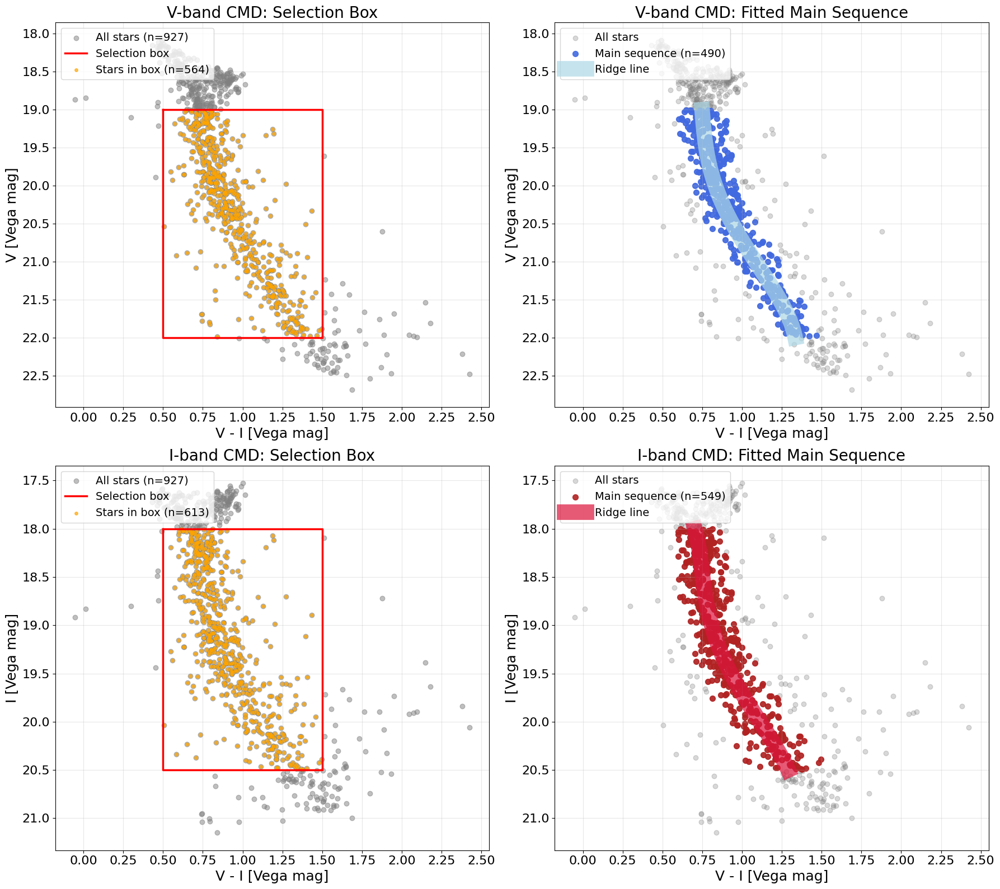

In [23]:
# Main sequence box parameters
V_mag_min, V_mag_max = 19.0, 22.0
V_color_min, V_color_max = 0.5, 1.5
I_mag_min, I_mag_max = 18.0, 20.5
I_color_min, I_color_max = 0.5, 1.5


# Fit V-band
print("\n--- V-band ---")
ms_mask_V, ridge_mag_V, ridge_color_V, n_iter_V = fit_main_sequence_ridge(
    mag_V_good, color_good,
    V_mag_min, V_mag_max, V_color_min, V_color_max,
    bin_size=0.4, poly_order=4
)
print(f"Final: {np.sum(ms_mask_V)} stars, {n_iter_V} iterations")

# Fit I-band
print("\n--- I-band ---")
ms_mask_I, ridge_mag_I, ridge_color_I, n_iter_I = fit_main_sequence_ridge(
    mag_I_good, color_good,
    I_mag_min, I_mag_max, I_color_min, I_color_max,
    bin_size=0.4, poly_order=4
)
print(f"Final: {np.sum(ms_mask_I)} stars, {n_iter_I} iterations")

# Plot results
plot_main_sequence_fit(
    mag_V_good, mag_I_good, color_good, color_err_good, mag_err_V_good, mag_err_I_good,
    ms_mask_V, ms_mask_I, ridge_mag_V, ridge_color_V, ridge_mag_I, ridge_color_I,
    V_mag_min, V_mag_max, V_color_min, V_color_max,
    I_mag_min, I_mag_max, I_color_min, I_color_max
)

## Calculating the distance

M15 ref galaxy d = 9.98 \pm 0.47 kpc (2004ApJ...602..264M) and the CMD referenced from (2001PASP..113...49H)

Just calculating the distance modulus

In [24]:
def calculate_cluster_distance(mag_V, color, mag_err_V, color_err, ms_mask,
                                ridge_mag, ridge_color,
                                ref_distance=9.98, ref_distance_err=0.47,
                                ref_V_center=22.5, graph_reading_err=0.25,
                                target_color=0.8, color_tolerance=0.02,
                                verbose=True):
    """
    Calculate cluster distance using main sequence fitting.
    
    Parameters
    ----------
    mag_V, color : array
        Magnitude and color arrays
    mag_err_V, color_err : array
        Error arrays
    ms_mask : boolean array
        Main sequence mask
    ridge_mag, ridge_color : array
        Ridge line arrays
    ref_distance : float
        Reference cluster distance in kpc
    ref_V_center : float
        Reference V magnitude at target color
    target_color : float
        Color at which to measure (default 0.8)
        
    Returns
    -------
    results : dict
        Dictionary with distance calculation results
    """
    if verbose:
        print(f"\nReference Cluster:")
        print(f"  Distance: {ref_distance:.2f} ± {ref_distance_err:.2f} kpc")
        print(f"  V magnitude at V-I = {target_color}: {ref_V_center:.2f} mag")
    
    # Reference distance modulus
    ref_distance_pc = ref_distance * 1000
    ref_mu = 5 * np.log10(ref_distance_pc) - 5
    ref_mu_err = (5 / (ref_distance * np.log(10))) * ref_distance_err
    
    if verbose:
        print(f"\nReference Distance Modulus: μ_ref = {ref_mu:.3f} ± {ref_mu_err:.3f} mag")
    
    # Get main sequence stars
    color_ms = color[ms_mask]
    mag_V_ms = mag_V[ms_mask]
    mag_err_V_ms = mag_err_V[ms_mask]
    
    # Find stars near target color
    color_mask = np.abs(color_ms - target_color) < color_tolerance
    n_stars_near = np.sum(color_mask)
    
    if verbose:
        print(f"\nStars within ±{color_tolerance:.2f} of V-I = {target_color}: {n_stars_near}")
    
    if n_stars_near == 0:
        print(f"WARNING: No stars found near V-I = {target_color}")
        return None
    
    mag_V_near = mag_V_ms[color_mask]
    mag_err_V_near = mag_err_V_ms[color_mask]
    
    # Interpolate ridge line
    sort_idx = np.argsort(ridge_color)
    ridge_color_sorted = ridge_color[sort_idx]
    ridge_mag_sorted = ridge_mag[sort_idx]
    
    if target_color < np.min(ridge_color_sorted) or target_color > np.max(ridge_color_sorted):
        print(f"WARNING: Target color {target_color} outside ridge line range")
        return None
    
    interp_func = interp1d(ridge_color_sorted, ridge_mag_sorted, kind='cubic')
    target_V = float(interp_func(target_color))
    
    # Error estimation
    target_V_err_scatter = np.std(mag_V_near) if len(mag_V_near) > 1 else 0.1
    target_V_err_phot = np.sqrt(np.mean(mag_err_V_near**2))
    target_V_err = np.sqrt(target_V_err_scatter**2 + target_V_err_phot**2)
    
    if verbose:
        print(f"\nTarget V magnitude at V-I = {target_color}: {target_V:.3f} ± {target_V_err:.3f} mag")
    
    # Reference absolute magnitude
    ref_M = ref_V_center - ref_mu
    ref_M_err = np.sqrt(graph_reading_err**2 + ref_mu_err**2)
    
    # Target distance modulus
    target_mu = target_V - ref_M
    target_mu_err = np.sqrt(target_V_err**2 + ref_M_err**2)
    
    # Convert to distance
    target_distance_pc = 10**((target_mu + 5) / 5)
    target_distance_kpc = target_distance_pc / 1000
    target_distance_err_pc = target_distance_pc * np.log(10) * target_mu_err / 5
    target_distance_err_kpc = target_distance_err_pc / 1000
    
    print(f"ref_mu = {ref_mu:.3f}")
    print(f"ref_M = {ref_M:.3f}")
    print(f"target_V = {target_V:.3f}")
    print(f"target_mu = {target_mu:.3f}")
    if verbose:
        print(f"\n" + "="*60)
        print("Results")
        
        print(f"\nTarget Cluster Distance:")
        print(f"  d = {target_distance_kpc:.2f} ± {target_distance_err_kpc:.2f} kpc")
        print(f"  d = {target_distance_pc:.0f} ± {target_distance_err_pc:.0f} pc")
        print(f"  Distance modulus: μ = {target_mu:.3f} ± {target_mu_err:.3f} mag")
    
    return {
        'target_V': target_V,
        'target_V_err': target_V_err,
        'target_mu': target_mu,
        'target_mu_err': target_mu_err,
        'target_distance_kpc': target_distance_kpc,
        'target_distance_err_kpc': target_distance_err_kpc,
        'ref_M': ref_M,
        'ref_M_err': ref_M_err,
        'n_stars_near': n_stars_near
    }
    
def plot_distance_measurement(mag_V, color, color_err, mag_err_V, ms_mask, 
                               ridge_mag, ridge_color,
                               target_color, target_V, target_V_err, 
                               color_tolerance=0.02):
    """
    Plot distance measurement location on CMD with shaded search region and error bars.
    
    Parameters
    ----------
    mag_V, color : array
        Magnitude and color arrays
    color_err, mag_err_V : array
        Error arrays
    ms_mask : boolean array
        Main sequence mask
    ridge_mag, ridge_color : array
        Ridge line arrays
    target_color : float
        Color at which measurement is made
    target_V : float
        Measured V magnitude at target color
    target_V_err : float
        Error on measured V magnitude
    color_tolerance : float
        Search tolerance around target color
    """
    
    # Get main sequence stars
    color_ms = color[ms_mask]
    mag_V_ms = mag_V[ms_mask]
    color_err_ms = color_err[ms_mask]
    mag_err_V_ms = mag_err_V[ms_mask]
    
    # Find stars near target color
    color_mask = np.abs(color_ms - target_color) < color_tolerance
    color_near = color_ms[color_mask]
    mag_V_near = mag_V_ms[color_mask]
    color_err_near = color_err_ms[color_mask]
    mag_err_V_near = mag_err_V_ms[color_mask]
    
    # Prepare ridge line interpolation for zoomed view
    from scipy.interpolate import interp1d
    sort_idx = np.argsort(ridge_color)
    ridge_color_sorted = ridge_color[sort_idx]
    ridge_mag_sorted = ridge_mag[sort_idx]
    
    fig, axes = plt.subplots(1, 2, figsize=(18, 8))
    
    # ========== Panel 1: Full CMD with measurement location ==========
    ax = axes[0]
    
    # Plot all main sequence stars (without error bars for clarity)
    ax.scatter(color_ms, mag_V_ms, s=15, alpha=0.5, c='royalblue', 
               label='Main sequence stars', zorder=2)
    
    # Plot ridge line
    ax.plot(ridge_color, ridge_mag, 'r-', linewidth=3, 
            label='Ridge line', zorder=10)
    
    # Show shaded search region (vertical strip)
    ax.fill_betweenx([mag_V_ms.min(), mag_V_ms.max()],
                      target_color - color_tolerance,
                      target_color + color_tolerance,
                      alpha=0.2, color='green', 
                      label=f'Search region (±{color_tolerance:.2f} mag)',
                      zorder=1)
    
    # Highlight measurement location with lines
    ax.axvline(target_color, color='green', linestyle='--', linewidth=2.5, 
               alpha=0.7, label=f'V-I = {target_color:.2f}', zorder=8)
    ax.axhline(target_V, color='green', linestyle='--', linewidth=2.5, 
               alpha=0.7, zorder=8)
    
    # Plot measurement point
    ax.plot(target_color, target_V, 'g*', markersize=25, 
            markeredgecolor='black', markeredgewidth=2, 
            label=f'Measurement point\nV = {target_V:.2f} mag', zorder=15)
    
    # Error bars on measurement point
    ax.errorbar([target_color], [target_V], 
                yerr=target_V_err,
                fmt='none', ecolor='green', elinewidth=3, capsize=8, capthick=3,
                zorder=14)
    
    ax.set_xlabel('V - I (F606W - F814W) [Vega mag]', fontsize=13, fontweight='bold')
    ax.set_ylabel('V (F606W) [Vega mag]', fontsize=13, fontweight='bold')
    ax.set_title(f'Distance Measurement Location\n(V = {target_V:.2f} ± {target_V_err:.2f} mag at V-I = {target_color:.2f})', 
                 fontsize=14, fontweight='bold')
    ax.invert_yaxis()
    ax.grid(True, alpha=0.3, linestyle='--', linewidth=1)
    ax.legend(loc='upper left', fontsize=10, framealpha=0.9)
    
    # ========== Panel 2: Zoomed view of measurement region ==========
    ax = axes[1]
    
    # Plot stars near target color WITH error bars
    ax.errorbar(color_near, mag_V_near,
                xerr=color_err_near, yerr=mag_err_V_near,
                fmt='o', markersize=8, alpha=0.7,
                elinewidth=1.5, capsize=4, capthick=1.5,
                color='royalblue', ecolor='black', 
                markeredgecolor='black', markeredgewidth=1,
                label=f'Stars near V-I = {target_color:.2f} (n={len(color_near)})',
                zorder=5)
    
    # Interpolate ridge line in zoomed region for smooth curve
    color_zoom_min = max(target_color - color_tolerance * 1.5, ridge_color_sorted.min())
    color_zoom_max = min(target_color + color_tolerance * 1.5, ridge_color_sorted.max())
    
    if color_zoom_min < color_zoom_max:
        color_zoom = np.linspace(color_zoom_min, color_zoom_max, 100)
        interp_func = interp1d(ridge_color_sorted, ridge_mag_sorted, kind='cubic')
        mag_zoom = interp_func(color_zoom)
        ax.plot(color_zoom, mag_zoom, 'r-', linewidth=3, 
                label='Ridge line', zorder=10)
    
    # Show shaded search region (zoomed)
    y_min_zoom = mag_V_near.min() - 0.5 if len(mag_V_near) > 0 else target_V - 1
    y_max_zoom = mag_V_near.max() + 0.5 if len(mag_V_near) > 0 else target_V + 1
    ax.fill_betweenx([y_min_zoom, y_max_zoom],
                      target_color - color_tolerance,
                      target_color + color_tolerance,
                      alpha=0.15, color='green',
                      label=f'Search region (±{color_tolerance:.2f} mag)',
                      zorder=1)
    
    # Measurement location
    ax.axvline(target_color, color='green', linestyle='--', linewidth=2.5, 
               alpha=0.8, zorder=8)
    ax.axhline(target_V, color='green', linestyle='--', linewidth=2.5, 
               alpha=0.8, zorder=8)
    ax.plot(target_color, target_V, 'g*', markersize=35, 
            markeredgecolor='black', markeredgewidth=2.5, 
            zorder=15)
    
    # Error bars on measurement point (larger for visibility)
    ax.errorbar([target_color], [target_V], 
                yerr=target_V_err,
                fmt='none', ecolor='green', elinewidth=4, capsize=10, capthick=4,
                label=f'Measurement error (±{target_V_err:.3f} mag)',
                zorder=14)
    
    ax.set_xlabel('V - I (F606W - F814W) [Vega mag]', fontsize=13, fontweight='bold')
    ax.set_ylabel('V (F606W) [Vega mag]', fontsize=13, fontweight='bold')
    ax.set_title(f'Zoomed: Measurement Region\n({len(color_near)} stars within ±{color_tolerance:.2f} mag)', 
                 fontsize=14, fontweight='bold')
    ax.invert_yaxis()
    ax.grid(True, alpha=0.3, linestyle='--', linewidth=1)
    ax.legend(loc='upper left', fontsize=10, framealpha=0.9)
    
    # Set zoom limits
    ax.set_xlim(target_color - color_tolerance * 1.5, 
                target_color + color_tolerance * 1.5)
    
    # Set y-limits to show all nearby stars plus some margin
    if len(mag_V_near) > 0:
        y_margin = 0.3
        ax.set_ylim(y_max_zoom, y_min_zoom)  # Remember inverted y-axis
    
    plt.tight_layout()
    plt.savefig(images_dir + 'distmod_region.png', dpi=300)
    plt.show()
    
    # Print statistics about nearby stars
    
    print("Region Stats")
    print("="*60)
    print(f"\nStars within ±{color_tolerance:.2f} mag of V-I = {target_color:.2f}:")
    print(f"  Number of stars: {len(color_near)}")
    if len(color_near) > 0:
        print(f"  V magnitude range: [{mag_V_near.min():.3f}, {mag_V_near.max():.3f}]")
        print(f"  V magnitude scatter (σ): {np.std(mag_V_near):.4f} mag")
        print(f"  Mean V magnitude: {np.mean(mag_V_near):.3f} ± {np.std(mag_V_near):.4f}")
        print(f"  Interpolated ridge V: {target_V:.3f} ± {target_V_err:.3f}")
        print(f"\n  Color (V-I) range: [{color_near.min():.3f}, {color_near.max():.3f}]")
        print(f"  Mean color: {np.mean(color_near):.3f} ± {np.std(color_near):.4f}")
        print(f"  Target color: {target_color:.2f}")


Reference Cluster:
  Distance: 9.98 ± 0.47 kpc
  V magnitude at V-I = 0.8: 22.50 mag

Reference Distance Modulus: μ_ref = 14.996 ± 0.102 mag

Stars within ±0.05 of V-I = 0.8: 129

Target V magnitude at V-I = 0.8: 19.774 ± 0.410 mag
ref_mu = 14.996
ref_M = 7.504
target_V = 19.774
target_mu = 12.270

Results

Target Cluster Distance:
  d = 2.84 ± 0.64 kpc
  d = 2844 ± 643 pc
  Distance modulus: μ = 12.270 ± 0.491 mag


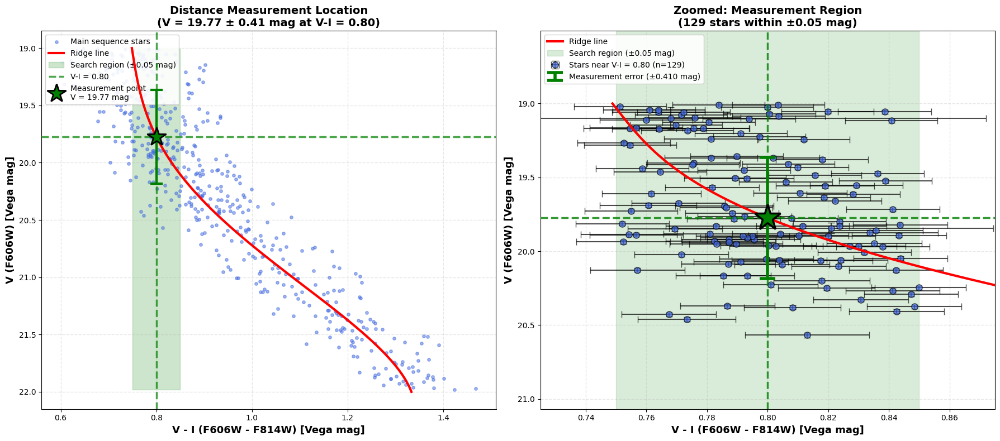

Region Stats

Stars within ±0.05 mag of V-I = 0.80:
  Number of stars: 129
  V magnitude range: [19.008, 20.568]
  V magnitude scatter (σ): 0.4098 mag
  Mean V magnitude: 19.683 ± 0.4098
  Interpolated ridge V: 19.774 ± 0.410

  Color (V-I) range: [0.751, 0.850]
  Mean color: 0.798 ± 0.0272
  Target color: 0.80


In [25]:
# Reference cluster parameters (M15)
ref_distance = 9.98  # kpc
ref_distance_err = 0.47
ref_V_center = 22.5
graph_reading_err = 0.25
target_color = 0.8
color_tolerance = 0.05

distance_results = calculate_cluster_distance(
    mag_V_good, color_good, mag_err_V_good, color_err_good, ms_mask_V,
    ridge_mag_V, ridge_color_V,
    ref_distance=ref_distance,
    ref_distance_err=ref_distance_err,
    ref_V_center=ref_V_center,
    graph_reading_err=graph_reading_err,
    target_color=target_color,
    color_tolerance=color_tolerance
)

# Plot measurement location
if distance_results is not None:
    plot_distance_measurement(
        mag_V_good, color_good, color_err_good, mag_err_V_good, ms_mask_V,
        ridge_mag_V, ridge_color_V,
        target_color, distance_results['target_V'], distance_results['target_V_err'],
        color_tolerance
    )

In [26]:
def compare_distances(results_faint, results_bright, 
                      V_mag_min, V_mag_max, V_color_min, V_color_max,
                      ref_distance=9.98, ref_distance_err=0.47,
                      ref_V_center=22.5, target_color=0.8):
    """Compare distance calculations between faint-only and with-bright datasets."""
    
    
    print("C.omparing distances: Faint only vs Faint + Bright")
    
    
    # Filter both datasets
    good_faint, _ = filter_by_errors(results_faint['matched'])
    good_bright, _ = filter_by_errors(results_bright['matched'])
    
    results = {}
    
    for label, data in [('Faint Only', good_faint), ('With Bright', good_bright)]:
        print(f"\n--- {label} ---")
        
        # Fit main sequence
        ms_mask, ridge_mag, ridge_color, n_iter = fit_main_sequence_ridge(
            data['mag_V'], data['color'],
            V_mag_min, V_mag_max, V_color_min, V_color_max,
            bin_size=0.4, poly_order=4, verbose=True
        )
        print(f"Main sequence: {np.sum(ms_mask)} stars")
        
        # Calculate distance
        dist = calculate_cluster_distance(
            data['mag_V'], data['color'], data['mag_err_V'], data['color_err'],
            ms_mask, ridge_mag, ridge_color,
            ref_distance=ref_distance, ref_distance_err=ref_distance_err,
            ref_V_center=ref_V_center, target_color=target_color,
            verbose=False
        )
        
        if dist is not None:
            print(f"Distance: {dist['target_distance_kpc']:.2f} ± {dist['target_distance_err_kpc']:.2f} kpc")
            results[label] = {
                'ms_mask': ms_mask,
                'ridge_mag': ridge_mag,
                'ridge_color': ridge_color,
                'distance': dist,
                'data': data
            }
    
    # Compare
    if 'Faint Only' in results and 'With Bright' in results:
        d1 = results['Faint Only']['distance']['target_distance_kpc']
        d2 = results['With Bright']['distance']['target_distance_kpc']
        diff = d2 - d1
        print(f"\n--- Comparison ---")
        print(f"Difference: {diff:.3f} kpc ({100*diff/d1:.1f}%)")
    
    return results


# Run comparison
distance_comparison = compare_distances(
    results_faint_only, results_with_bright,
    V_mag_min, V_mag_max, V_color_min, V_color_max,
    ref_distance=ref_distance, ref_V_center=ref_V_center, target_color=target_color
)

C.omparing distances: Faint only vs Faint + Bright

--- Faint Only ---

[1] Applying initial box selection...
    Magnitude range: [19.00, 22.00]
    Color range: [0.50, 1.50]
    Stars in box: 562

[2] Iterative ridge line fitting...
    Iteration 1: 531 stars, 31 rejected
    Iteration 2: 508 stars, 23 rejected
    Iteration 3: 498 stars, 10 rejected
    Iteration 4: 495 stars, 3 rejected
    Iteration 5: 493 stars, 2 rejected
    Iteration 6: 491 stars, 2 rejected
    Iteration 7: 490 stars, 1 rejected
    Iteration 8: 490 stars, 0 rejected
    Converged after 8 iterations
Main sequence: 490 stars
ref_mu = 14.996
ref_M = 7.504
target_V = 19.777
target_mu = 12.273
Distance: 2.85 ± 0.62 kpc

--- With Bright ---

[1] Applying initial box selection...
    Magnitude range: [19.00, 22.00]
    Color range: [0.50, 1.50]
    Stars in box: 562

[2] Iterative ridge line fitting...
    Iteration 1: 531 stars, 31 rejected
    Iteration 2: 508 stars, 23 rejected
    Iteration 3: 498 stars, 10 rej

In [ ]:
# Use the dataset that includes bright stars and passes filtering
use_bright = True  # Set to False to use only faint stars
use_data = results_with_bright if use_bright else results_faint_only
matched = use_data['matched']

# Filter for good quality stars
good_quality = ((matched['mag_err_V'] < max_mag_err) & 
                (matched['mag_err_I'] < max_mag_err) & 
                (matched['color_err'] < max_color_err))

# Extract good quality stars
color_filtered = matched['color'][good_quality]
mag_V_filtered = matched['mag_V'][good_quality]
mag_err_V_filtered = matched['mag_err_V'][good_quality]
mag_I_filtered = matched['mag_I'][good_quality]
mag_err_I_filtered = matched['mag_err_I'][good_quality]
color_err_filtered = matched['color_err'][good_quality]
x_pos_filtered = matched['x'][good_quality]
y_pos_filtered = matched['y'][good_quality]

# Refit MS on the filtered data to get proper flags
ms_mask_filtered, _, _, _ = fit_main_sequence_ridge(
    mag_V_filtered, color_filtered,
    V_mag_min, V_mag_max, V_color_min, V_color_max,
    bin_size=0.4, poly_order=4, verbose=False
)

# Back-calculate flux from the magnitudes we have
# flux = 10^((ZP - mag) / 2.5)
zp_vega_F606W = 26.0039
zp_vega_F814W = 24.6985

flux_V_filtered = 10**((zp_vega_F606W - mag_V_filtered) / 2.5)
flux_I_filtered = 10**((zp_vega_F814W - mag_I_filtered) / 2.5)

# Propagate magnitude errors to flux errors
# d(flux)/d(mag) = -flux * ln(10) / 2.5
flux_err_V_filtered = flux_V_filtered * mag_err_V_filtered * np.log(10) / 2.5
flux_err_I_filtered = flux_I_filtered * mag_err_I_filtered * np.log(10) / 2.5

# Build catalog
catalog_data = {
    'V_flux': flux_V_filtered,
    'V_flux_err': flux_err_V_filtered,
    'V_mag': mag_V_filtered,
    'V_mag_err': mag_err_V_filtered,
    'I_flux': flux_I_filtered,
    'I_flux_err': flux_err_I_filtered,
    'I_mag': mag_I_filtered,
    'I_mag_err': mag_err_I_filtered,
    'V_minus_I': color_filtered,
    'color_err': color_err_filtered,
    'X_pos': x_pos_filtered,
    'Y_pos': y_pos_filtered,
    'Main_Sequence': ms_mask_filtered
}

catalog_df = pd.DataFrame(catalog_data)

# Sort by V magnitude (brightest first)
catalog_df = catalog_df.sort_values('V_mag', ascending=True).reset_index(drop=True)

# Save to CSV
output_file = 'cmd_star_catalog.csv'
catalog_df.to_csv(output_file, index=False, float_format='%.4f')